# Prepare Notebook

In [3]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import sys
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import numpyro
print(numpyro.__version__)

import jax
import tensorflow_probability.substrates.jax.math as tfp_jax_math
print("jax version:", jax.__version__)
print("erfcx:", tfp_jax_math.erfcx(1.0))

from pymc_extras.prior import Prior
from pymc_marketing.metrics import crps
from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim
from statsmodels.stats.outliers_influence import variance_inflation_factor


az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100



0.19.0
jax version: 0.4.35
erfcx: 0.42758358


In [4]:
seed: int = sum(map(ord, "mmm")) 
# seed: int = 327
rng: np.random.Generator = np.random.default_rng(seed=seed)

# Load Data

We remove or exclude some columns from analysis when: 
- they’re empty / sparse / missing.
- Collinearity (digital video/audio/display/social/search can be highly correlated)
- SEM endogeneity (paid search often “captures demand”
- Scale/outliers

In [5]:
raw_df = pd.read_csv("https://raw.githubusercontent.com/sibylhe/mmm_stan/main/data.csv")

# 1. control variables
# We just keep the holidays columns
control_columns = [col for col in raw_df.columns if "hldy_" in col]


# 2. media variables
channel_columns_raw = sorted(
    [
        col
        for col in raw_df.columns
        if "mdsp_" in col
        and col != "mdsp_viddig" 
        and col != "mdsp_auddig"
        and col != "mdsp_sem"
    ]
)


channel_mapping = {
    "mdsp_dm": "Direct Mail",
    "mdsp_inst": "Insert",
    "mdsp_nsp": "Newspaper",
    "mdsp_audtr": "Radio",
    "mdsp_vidtr": "TV",
    "mdsp_so": "Social Media",
    "mdsp_on": "Online Display",
}

channel_columns = sorted(list(channel_mapping.values()))

# 3. sales variables
sales_col = "sales"

data_df = raw_df[["wk_strt_dt", sales_col, *channel_columns_raw, *control_columns]]
data_df = data_df.rename(columns=channel_mapping)


# 4. Date column
data_df["wk_strt_dt"] = pd.to_datetime(data_df["wk_strt_dt"])
date_column = "wk_strt_dt"

In [6]:
# display raw data
pd.set_option("display.max_columns", None)  
raw_df.head(3)

,wk_strt_dt,yr_nbr,qtr_nbr,prd,wk_nbr,wk_in_yr_nbr,mdip_dm,mdip_inst,mdip_nsp,mdip_auddig,mdip_audtr,mdip_vidtr,mdip_viddig,mdip_so,mdip_on,mdip_em,mdip_sms,mdip_aff,mdip_sem,mdsp_dm,mdsp_inst,mdsp_nsp,mdsp_auddig,mdsp_audtr,mdsp_vidtr,mdsp_viddig,mdsp_so,mdsp_on,mdsp_sem,sales,me_ics_all,me_gas_dpg,st_ct,mrkdn_valadd_edw,mrkdn_pdm,va_pub_0.15,va_pub_0.2,va_pub_0.25,va_pub_0.3,hldy_Black Friday,hldy_Christmas Day,hldy_Christmas Eve,hldy_Columbus Day,hldy_Cyber Monday,hldy_Day after Christmas,hldy_Easter,hldy_Father's Day,hldy_Green Monday,hldy_July 4th,hldy_Labor Day,hldy_MLK,hldy_Memorial Day,hldy_Mother's Day,hldy_NYE,hldy_New Year's Day,hldy_Pre Thanksgiving,hldy_Presidents Day,hldy_Prime Day,hldy_Thanksgiving,hldy_Valentine's Day,hldy_Veterans Day,seas_prd_1,seas_prd_2,seas_prd_3,seas_prd_4,seas_prd_5,seas_prd_6,seas_prd_7,seas_prd_8,seas_prd_9,seas_prd_12,seas_week_40,seas_week_41,seas_week_42,seas_week_43,seas_week_44,seas_week_45,seas_week_46,seas_week_47,seas_week_48
0,2014-08-03,2014,3,7,1,27,4863885,29087520,2421933,692315,37778097,10038746,2111112,0,3271007,1514755,27281,197828,83054,678410.26,129759.66,507635.16,2700.69,254134.14,216725.59,45397.90,0.0,61364.75,355954.51,72051457.64,82.5,3.595,716.285714,0.0,0.368029,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,2014-08-10,2014,3,7,2,28,20887502,8345120,3984494,475810,12063657,9847977,587184,0,4260715,2234569,27531,123688,83124,661097.71,70355.33,625719.37,5039.35,106602.98,108919.26,2903.36,0.0,132643.90,336306.72,78794770.54,82.5,3.582,716.428571,0.0,0.360911,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,2014-08-17,2014,3,7,3,29,11097724,17276800,1846832,784732,5770115,7235336,1015658,0,4405992,1616990,55267,186781,79768,1874338.43,107720.37,277532.61,2610.93,59011.42,74032.19,8110.48,0.0,76741.27,344787.96,70071185.56,82.5,3.549,717.000000,0.0,0.344832,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [7]:
# Display clean df
data_df.head(3)

,wk_strt_dt,sales,Radio,Direct Mail,Insert,Newspaper,Online Display,Social Media,TV,hldy_Black Friday,hldy_Christmas Day,hldy_Christmas Eve,hldy_Columbus Day,hldy_Cyber Monday,hldy_Day after Christmas,hldy_Easter,hldy_Father's Day,hldy_Green Monday,hldy_July 4th,hldy_Labor Day,hldy_MLK,hldy_Memorial Day,hldy_Mother's Day,hldy_NYE,hldy_New Year's Day,hldy_Pre Thanksgiving,hldy_Presidents Day,hldy_Prime Day,hldy_Thanksgiving,hldy_Valentine's Day,hldy_Veterans Day
0,2014-08-03,72051457.64,254134.14,678410.26,129759.66,507635.16,61364.75,0.0,216725.59,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2014-08-10,78794770.54,106602.98,661097.71,70355.33,625719.37,132643.90,0.0,108919.26,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2014-08-17,70071185.56,59011.42,1874338.43,107720.37,277532.61,76741.27,0.0,74032.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Cleaning

In [8]:
# ---------------------------
# CONFIG
# ---------------------------
date_col = "wk_strt_dt"
target_col = "sales"
media_prefix = "mdsp_"

VIF_THRESH = 5.0
CORR_THRESH = 0.50          # high correlation with sales (SEM often triggers this)
DOMINANCE_THRESH = 20.0     # max / median ratio (spikiness)
SCALE_THRESH = 100.0        # median vs typical channel median (dominance)

# ---------------------------
# PREP
# ---------------------------
df = raw_df.copy()
df[date_col] = pd.to_datetime(df[date_col])

media_cols = [c for c in df.columns if c.startswith(media_prefix)]
assert target_col in df.columns, f"Missing target_col={target_col}"
assert len(media_cols) > 0, "No media columns found (mdsp_*)"

# Keep only numeric media columns (just in case)
media_cols = [c for c in media_cols if pd.api.types.is_numeric_dtype(df[c])]

# ---------------------------
# 1) VIF (multicollinearity)
# ---------------------------
X = df[media_cols].fillna(0).to_numpy()
vif_vals = {}
for i, col in enumerate(media_cols):
    vif_vals[col] = float(variance_inflation_factor(X, i))

# ---------------------------
# 2) Corr with sales (endogeneity risk indicator)
# ---------------------------
corr_with_sales = df[media_cols + [target_col]].corr(numeric_only=True)[target_col].drop(target_col)

# ---------------------------
# 3) Dominance / spikiness
#    - dominance: median compared to typical channel median
#    - spiky: max / median
# ---------------------------
med = df[media_cols].median(numeric_only=True)
mx = df[media_cols].max(numeric_only=True)

typical_median = med.median() if med.median() != 0 else 1.0
dominance = (med / typical_median).replace([np.inf, -np.inf], np.nan)

# avoid divide-by-zero in spikiness
spiky = (mx / med.replace(0, np.nan)).replace([np.inf, -np.inf], np.nan)

# ---------------------------
# 4) Build a diagnostics table + flags
# ---------------------------
diag = pd.DataFrame({
    "vif": pd.Series(vif_vals),
    "corr_sales": corr_with_sales,
    "median": med,
    "max": mx,
    "dominance_med_vs_typical": dominance,
    "spiky_max_over_median": spiky,
}).sort_index()

diag["flag_high_vif"] = diag["vif"] >= VIF_THRESH
diag["flag_high_corr_sales"] = diag["corr_sales"].abs() >= CORR_THRESH
diag["flag_dominant_scale"] = diag["dominance_med_vs_typical"] >= SCALE_THRESH
diag["flag_spiky"] = diag["spiky_max_over_median"] >= DOMINANCE_THRESH

# simple score (you can tune weights)
diag["risk_score"] = (
    2.0 * diag["flag_high_vif"].astype(int) +
    2.0 * diag["flag_high_corr_sales"].astype(int) +
    1.0 * diag["flag_dominant_scale"].astype(int) +
    1.0 * diag["flag_spiky"].astype(int)
)

# show top suspects
diag_sorted = diag.sort_values(["risk_score", "vif", "corr_sales"], ascending=False)
diag_sorted.head(15)

,vif,corr_sales,median,max,dominance_med_vs_typical,spiky_max_over_median,flag_high_vif,flag_high_corr_sales,flag_dominant_scale,flag_spiky,risk_score
mdsp_vidtr,6.174248,0.656737,112353.17,1100083.38,0.983929,9.791298,True,True,False,False,4.0
mdsp_sem,5.021522,0.586409,485503.95,3134565.13,4.251783,6.456312,True,True,False,False,4.0
mdsp_on,8.345766,0.483327,186763.14,695750.18,1.635571,3.725308,True,False,False,False,2.0
mdsp_audtr,5.795672,0.276630,116023.47,435614.54,1.016071,3.754538,True,False,False,False,2.0
mdsp_auddig,5.709502,0.370946,3237.40,13064.83,0.028351,4.035593,True,False,False,False,2.0
mdsp_inst,3.956339,0.519472,61208.05,590148.11,0.536027,9.641675,False,True,False,False,2.0
mdsp_so,4.622161,0.334859,70799.44,573355.55,0.620023,8.098306,False,False,False,False,0.0
mdsp_viddig,4.388366,0.458389,12991.09,104352.44,0.113769,8.032616,False,False,False,False,0.0
mdsp_nsp,3.399146,0.423797,128694.67,2198467.40,1.127039,17.082816,False,False,False,False,0.0
mdsp_dm,2.784537,0.148539,670909.25,2409895.71,5.875463,3.591985,False,False,False,False,0.0


# Exploratory Data Analysis

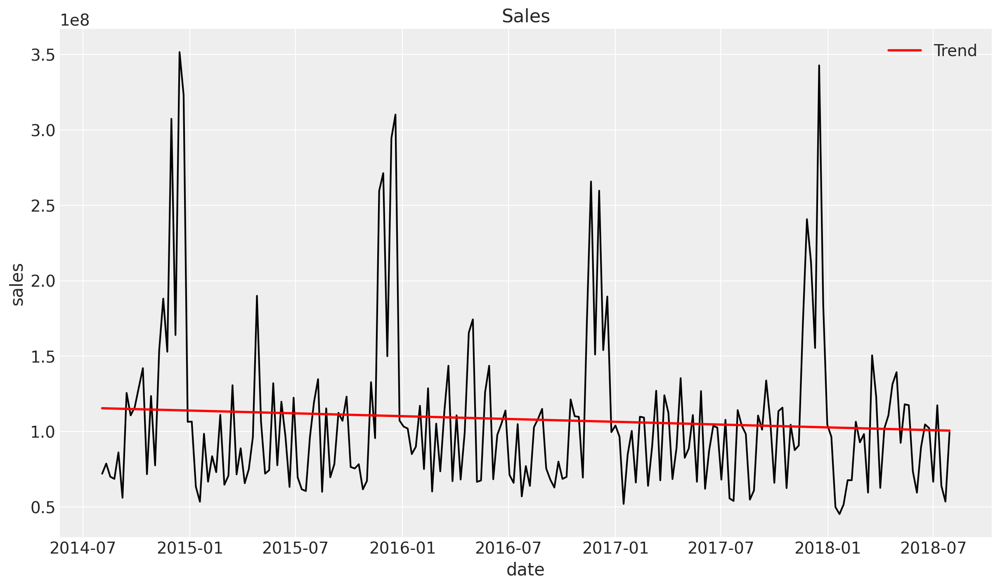

In [9]:
fig, ax = plt.subplots()

# Sales line
sns.lineplot(data=data_df, x=date_column, y="sales", color="black", ax=ax)

# Trend line (linear)
tmp = data_df[[date_column, "sales"]].dropna().sort_values(date_column).copy()
x = tmp[date_column].map(pd.Timestamp.toordinal).to_numpy()
y = tmp["sales"].to_numpy()

m, b = np.polyfit(x, y, 1)                 # y = m*x + b
trend = m * x + b

ax.plot(tmp[date_column], trend, color="red", linewidth=2, label="Trend")

ax.set(title="Sales", xlabel="date", ylabel="sales")
ax.legend()
plt.show()


The sales series shows clear seasonality with recurring peaks/troughs over time, and the fitted red line indicates a slight downward trend in average sales across the period.

C:\Users\Taha\AppData\Local\Temp\ipykernel_3300\3906045624.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


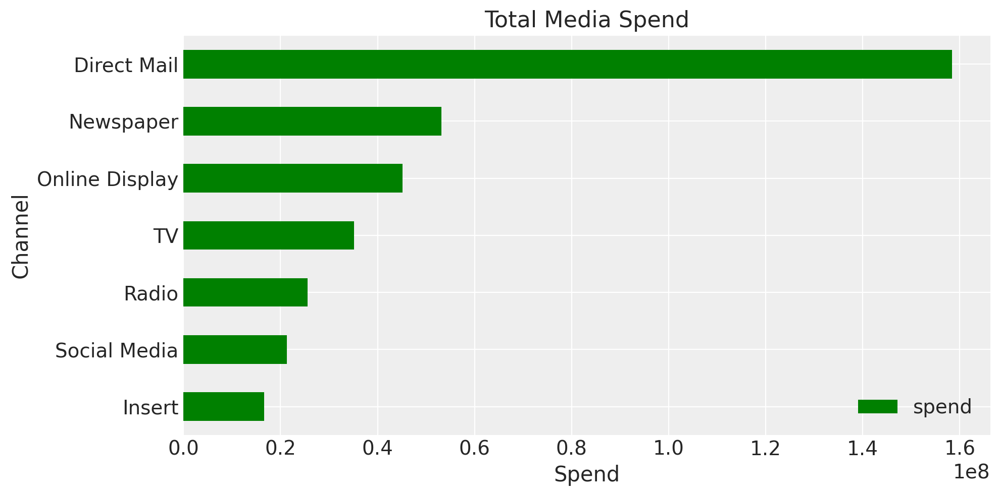

In [10]:
fig, ax = plt.subplots(figsize=(10, 5))

(
    data_df.melt(value_vars=channel_columns, var_name="channel", value_name="spend")
    .groupby("channel", as_index=True)
    .agg({"spend": "sum"})
    .sort_values(by="spend")
    .plot.barh(ax=ax, color="green")
)

ax.set(title="Total Media Spend", xlabel="Spend", ylabel="Channel")
plt.tight_layout()
plt.show()


Direct Mail is the channel with the highest spend, followed by Newspaper and Online Display.

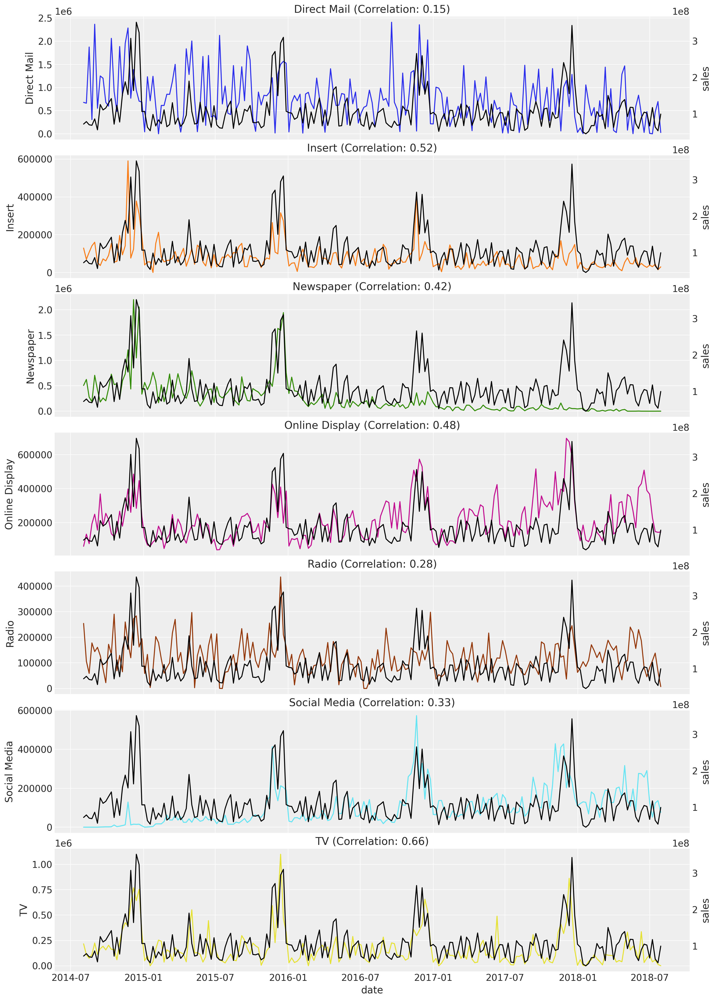

In [11]:
n_channels = len(channel_columns)

fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    ax_twin = ax.twinx()
    sns.lineplot(data=data_df, x=date_column, y=channel, color=f"C{i}", ax=ax)
    sns.lineplot(data=data_df, x=date_column, y=sales_col, color="black", ax=ax_twin)
    correlation = data_df[[channel, sales_col]].corr().iloc[0, 1]
    ax_twin.grid(None)
    ax.set(title=f"{channel} (Correlation: {correlation:.2f})")

ax.set_xlabel("date");

**Correlation** does not imply causation. However, examining correlations between marketing channels and the target variable is a useful sanity check: it can reveal data issues (common in real-world datasets) and suggest directions for feature engineering. In this dataset, TV, Insert, and Online Display show the strongest correlations with sales. Notably, Direct Mail—despite being the largest channel by spend—has the weakest correlation with sales.

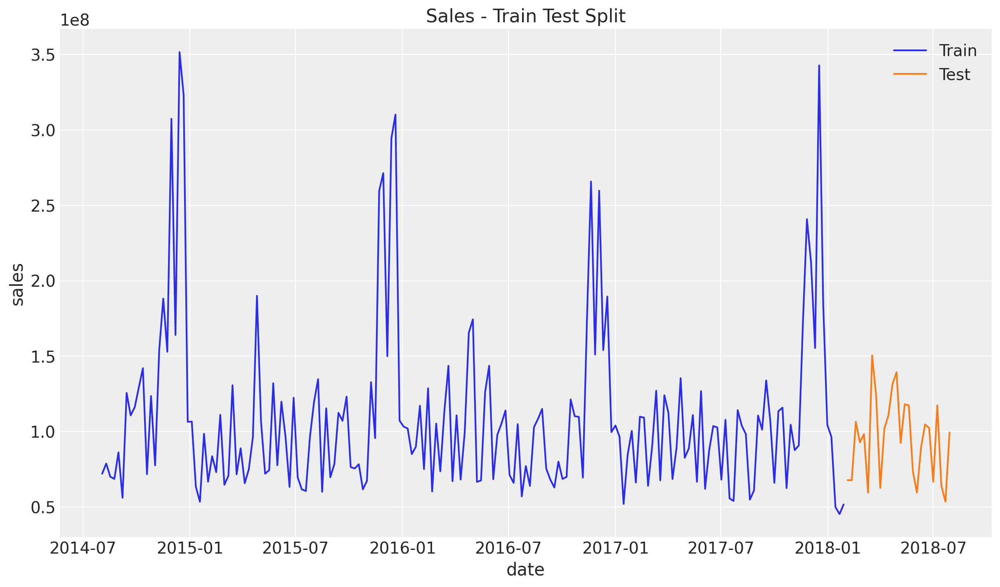

In [12]:
# boundary date is 2018-02-01
train_test_split_date = pd.to_datetime("2018-02-01")

train_mask = data_df.wk_strt_dt <= train_test_split_date
test_mask = data_df.wk_strt_dt > train_test_split_date

train_df = data_df[train_mask]
test_df = data_df[test_mask]

fig, ax = plt.subplots()
sns.lineplot(data=train_df, x="wk_strt_dt", y="sales", color="C0", label="Train", ax=ax)
sns.lineplot(data=test_df, x="wk_strt_dt", y="sales", color="C1", label="Test", ax=ax)
ax.set(title="Sales - Train Test Split", xlabel="date");

In [13]:
X_train = train_df.drop(columns=sales_col)
X_test = test_df.drop(columns=sales_col)

y_train = train_df[sales_col]
y_test = test_df[sales_col]

# Model Specification

For this first iteration, we start with spend-based priors as a practical baseline. In a later iteration, we can incorporate lift test results to better calibrate the model. The idea is to use spend share as a rough proxy for each channel’s potential impact on sales. While imperfect, it provides a reasonable starting point: higher-spend channels are given wider priors, allowing more flexibility to explain variation in the data. Next, we compute spend shares using training data only.
- Fourier seasonality terms are a way to model repeating seasonal patterns (like yearly seasonality) by adding sine and cosine waves to the regression. In PyMC-Marketing, yearly_seasonality=5 means it includes 5 harmonics, i.e., 10 seasonal features

In [14]:
spend_shares = (
    X_train.melt(value_vars=channel_columns, var_name="channel", value_name="spend")
    .groupby("channel", as_index=False)
    .agg({"spend": "sum"})
    .sort_values(by="channel")
    .assign(spend_share=lambda x: x["spend"] / x["spend"].sum())["spend_share"]
    .to_numpy()
)

prior_sigma = spend_shares

In [15]:
prior_sigma

array([0.44983506, 0.04780756, 0.16278453, 0.11876576, 0.06840006,
       0.05234825, 0.10005879])

In [16]:
model_config = {
    "intercept": Prior("Normal", mu=0.2, sigma=0.05),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma, dims="channel"),
    "saturation_lam": Prior("Gamma", alpha=3, beta=1, dims="channel"),
    "gamma_control": Prior("Normal", mu=0, sigma=1),
    "gamma_fourier": Prior("Laplace", mu=0, b=1),
    "likelihood": Prior("TruncatedNormal", lower=0, sigma=Prior("HalfNormal", sigma=1)),
}

In [17]:
sampler_config = {"progressbar": True}

mmm = MMM(
    model_config=model_config,
    sampler_config=sampler_config,
    date_column=date_column,
    adstock=GeometricAdstock(l_max=6),
    saturation=LogisticSaturation(),
    channel_columns=channel_columns,
    control_columns=control_columns,
    yearly_seasonality=5,
)

# Prior Predictive Checks

Sampling: [adstock_alpha, gamma_control, gamma_fourier, intercept, saturation_beta, saturation_lam, y, y_sigma]


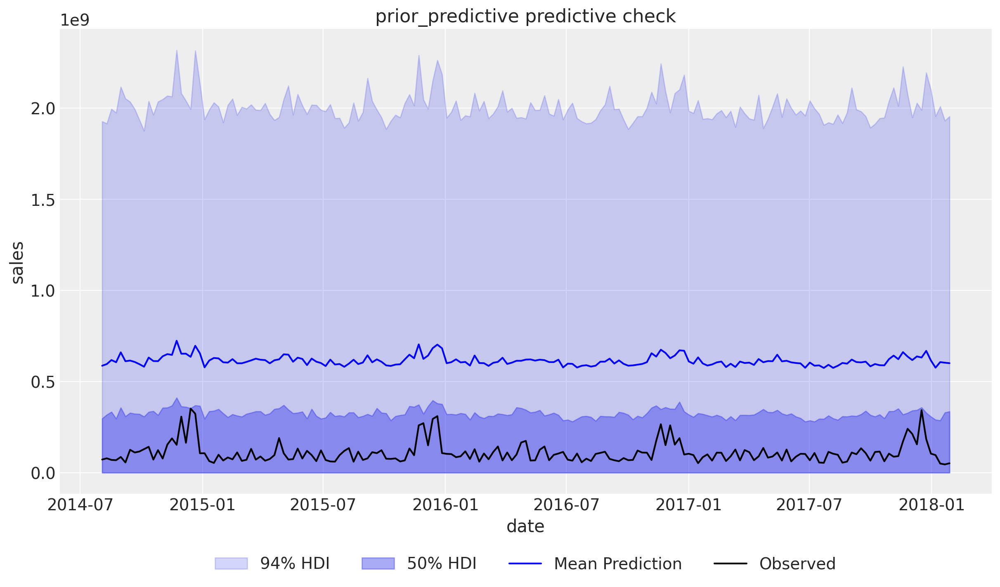

In [18]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X_train, y_train, samples=4_000)
fig, ax = plt.subplots()
fig = mmm.plot_prior_predictive(original_scale=True, ax=ax)
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=4)
ax.set(xlabel="date", ylabel="sales");

In this plot, the black line is the observed sales, the blue line is the mean sales simulated from the priors, and the shaded bands (50% and 94% HDI) show the range of sales values the model can generate before seeing any data. Here, the blue mean sits far above the black line and the observed series falls near the bottom of the shaded region, which indicates the priors are producing sales that are much larger than reality—so the priors (especially intercept/noise/scale) are likely too high or too wide and should be tightened or rescaled (or the target should be scaled).

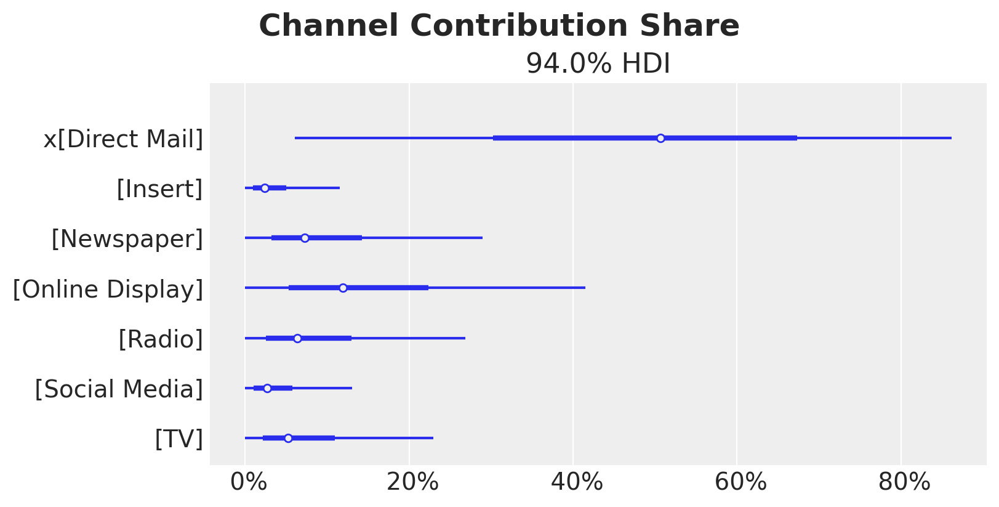

In [19]:
fig = mmm.plot_channel_contribution_share_hdi(prior=True, figsize=(8, 4))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

Here we can check that before fitting, do our priors imply reasonable channel contribution shares?
In the plot, each row corresponds to a media channel and the dot/line shows the prior-implied contribution share, while the horizontal bar is the 94% HDI representing uncertainty in that share before fitting. The plot indicates that, under the current priors, Direct Mail is allowed to account for a much larger portion of total contribution (with a very wide uncertainty range), whereas the other channels are concentrated at relatively small shares—reflecting the spend-share prior choice that gives higher-spend channels more flexibility until the data updates those beliefs.

# Model Fitting

- 4 independent MCMC chains (they ran sequentially because only 1 device available here).
- In MCMC, a draw is one sampled set of parameter values from the posterior distribution.
With draws=2000, each chain keeps 2000 posterior samples (after tuning).
With chains=4, we end up with about 4 × 2000 = 8000 posterior samples total (used to compute means, HDIs, contributions, ROAS, etc.).
- fourier_mode is the index for the sine/cosine seasonal components (Fourier terms) used to model yearly seasonality. yearly_seasonality=5 creates 10 seasonal features total (5 sine + 5 cosine), and fourier_mode labels those 10 components

In [20]:
mmm.fit(
    X=X_train,
    y=y_train,
    target_accept=0.9,
    chains=4,
    draws=2_000,
    nuts_sampler="numpyro",
    random_seed=rng,
)

C:\Users\Taha\anaconda3\envs\marketing311\Lib\site-packages\pymc\sampling\jax.py:475: UserWarning: There are not enough devices to run parallel chains: expected 4 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(4)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  pmap_numpyro = MCMC(
sample: 100%|██████████| 3000/3000 [02:00<00:00, 24.81it/s, 127 steps of size 3.86e-02. acc. prob=0.92]


Output()

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

- posterior: This is the posterior distribution of all model parameters after seeing the data.
- sample_stats (sampling diagnostics): These fields tells whether sampling was healthy
- prior and prior_predictive: These store the prior draws and prior predictive simulated were generated earlier (so they can be compared with prior vs posterior later).
- observed_data: is the actual training target series y with the date index—what the model conditioned on.
- constant_data (important!) This shows the transformed/scaled data that the MMM internally uses
- fit_data: A record of the data used for fitting (index length 183, plus other columns). It’s basically the “inputs snapshot” for reproducibility.

# Model Diagnostics

Before looking into the results let’s check some diagnostics. This section is checking MCMC sampling quality (did the Bayesian model converge, and are the posterior samples trustworthy?).

In [21]:
# Number of diverging samples
mmm.idata["sample_stats"]["diverging"].sum().item()

0

there is no evidence of divergent transitions, meaning NUTS (No-U-Turn Sampler) did not hit problematic regions of the posterior geometry. That’s a strong “sampling went fine” signal. 



In [22]:
az.summary(
    data=mmm.idata,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)["r_hat"].describe()

count    55.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
Name: r_hat, dtype: float64

On the other hand, the R-hat statistics are all close to 1, which is also good!
Next let’s look into the model trace.

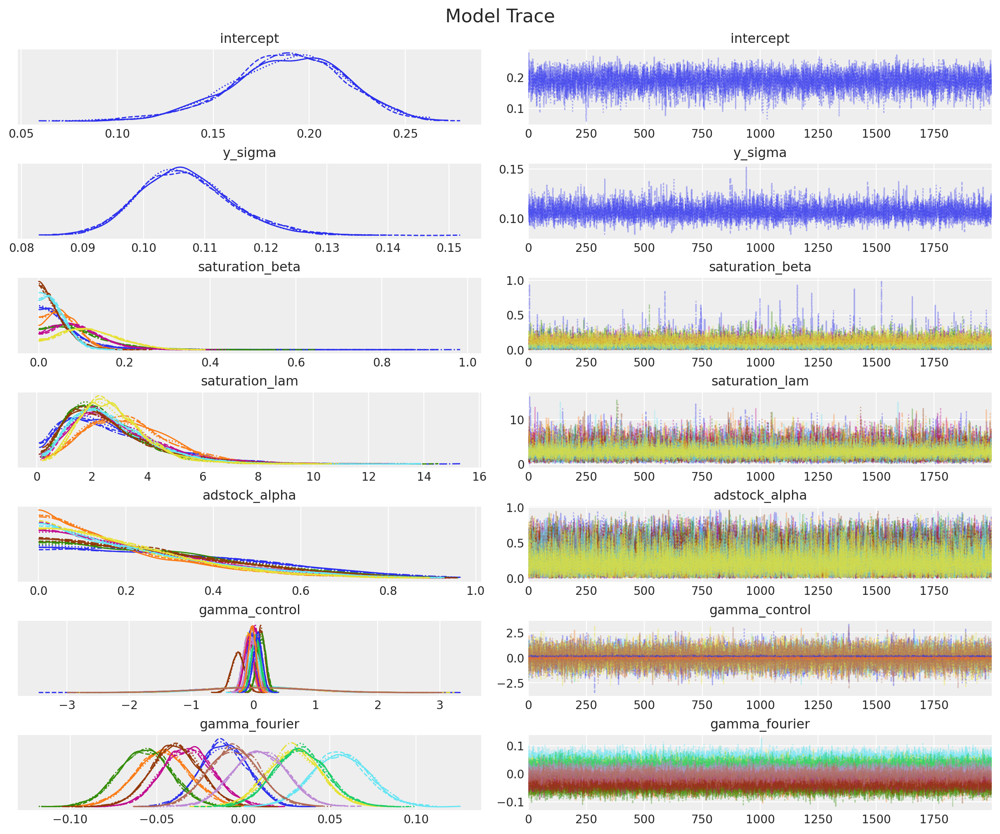

In [23]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

We see a good mixing in the trace, which is consistent with the good R-hat statistics.
- Left panels: posterior distributions per parameter (curves from different chains overlap closely).
- Right panels: sampled values over iterations (the “hairy caterpillar” look) with no drifting trends and good overlap across chains. This indicates good mixing, consistent with zero divergences and R-hat near 1.

Bottom line: the sampler converged cleanly, so you can trust the posterior draws for attribution, ROAS, and budget optimization.

# Posterior Predictive Checks

As our model and posterior samples are looking good, we can now look into the posterior predictive checks.

Posterior predictive checks: it uses the posterior draws (learned parameters) to simulate sales and compare those simulated sales to the real observed sales. Then it computes residuals (true − predicted) over time to see if errors look unbiased or show patterns.

Sampling: [y]


Output()

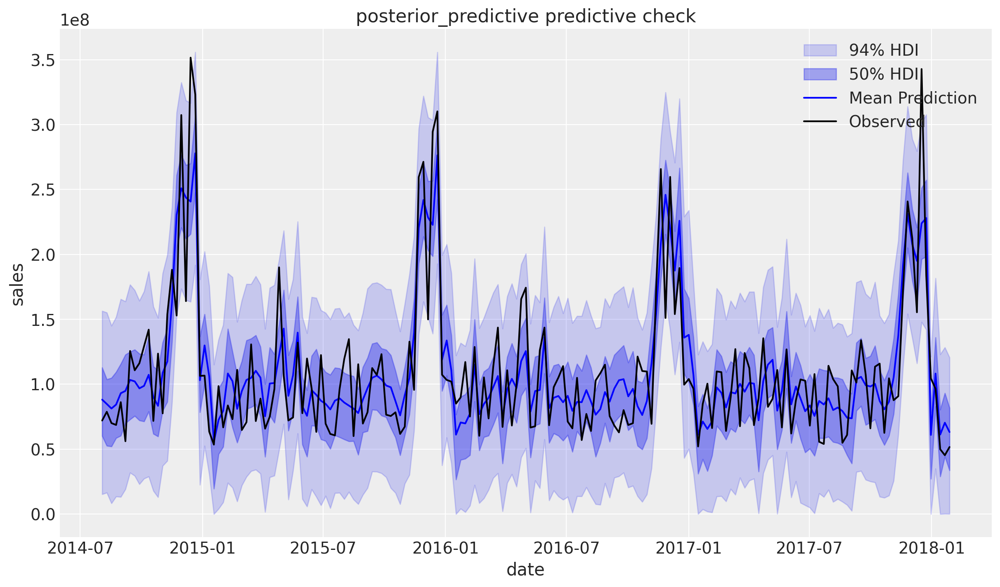

In [24]:
mmm.sample_posterior_predictive(
    X_train, original_scale=True, extend_idata=True, combined=True
)
fig = mmm.plot_posterior_predictive(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

The model is fitting the training period reasonably well: the blue mean generally follows the black line, and most of the observed spikes/valleys fall inside the uncertainty bands. Where the black line approaches or exceeds the band (big spikes), that’s where the model struggles most or needs more explanatory variables (often promos/holidays/outliers).

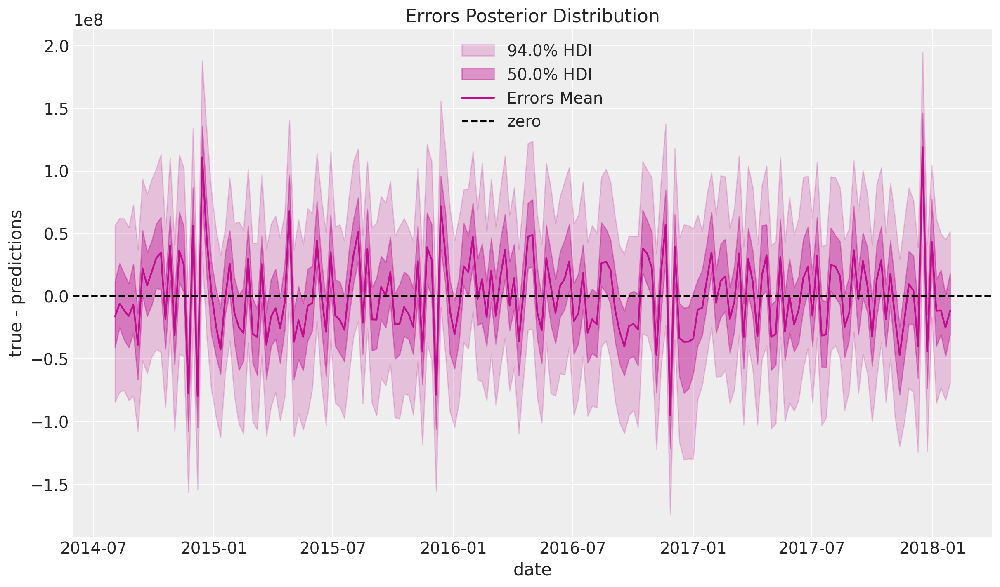

In [26]:
mmm.plot_errors(original_scale=True);

Errors are centered around zero most of the time and there’s no obvious time pattern (no consistent drift up/down), which suggests the model isn’t systematically overpredicting or underpredicting. The wider bands around certain dates indicate weeks with higher uncertainty / harder-to-explain variation (often spikes, unmodeled promotions, or rare events).


# Media Deep Dive

In this section we perform a deep dive into the media channels insights.

# Channel Contributions

Now that the global model fit looks good, the analysis moves to media and channel-level contributions. The next step reviews aggregated contributions by decomposing predicted sales into components to show where sales are coming from: baseline (intercept) + seasonality (Fourier) + controls (holidays/events) + media channels. It also summarizes the total contribution of each component over the full time period.

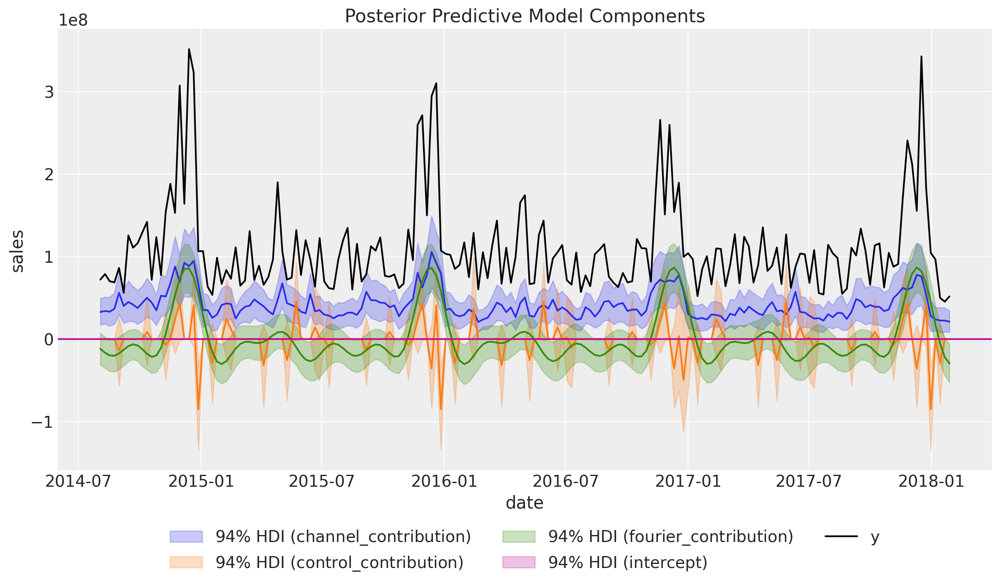

In [27]:
fig = mmm.plot_components_contributions(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

We can visually see when media and seasonality are driving changes: media contribution (blue) rises around major peaks, seasonality (green) adds recurring patterns, and controls (orange) create sharp one-off positive/negative bumps around specific holidays/events. The intercept is the steady “always-on” baseline underneath everything.

Next, looking deeper into the components. This graph ranks components by their cumulative share of total modeled sales across the whole dataset.

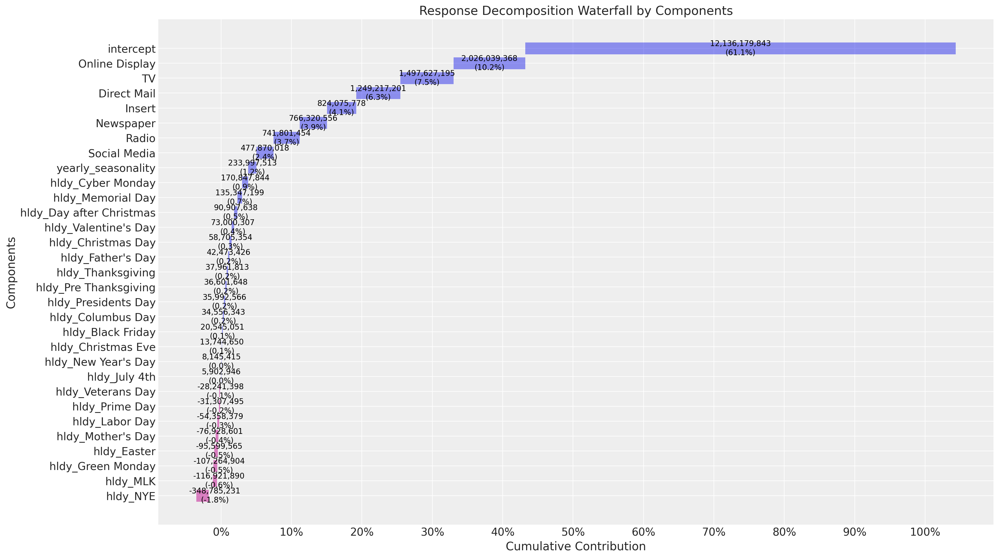

In [28]:
mmm.plot_waterfall_components_decomposition(figsize=(18, 10));

The waterfall decomposition shows that the intercept (baseline) accounts for the majority of modeled sales (~61%), meaning most volume is driven by non-media factors such as underlying demand, brand, and distribution. Among media channels, the largest positive incremental contributions come from Online Display, TV, and Direct Mail. Yearly seasonality adds a smaller but positive share, capturing recurring demand patterns. Holiday/control variables contribute relatively small positives or negatives, reflecting short-lived lifts or post-holiday dips that the model separates from media impact. Overall, the model indicates baseline dominates total sales, while a few top channels drive most of the incremental media lift and controls/seasonality mainly explain timing effects.

# Saturation Curves

We continue our analysis by looking into the direct response curves. These will be the main input for the budget optimization step below.

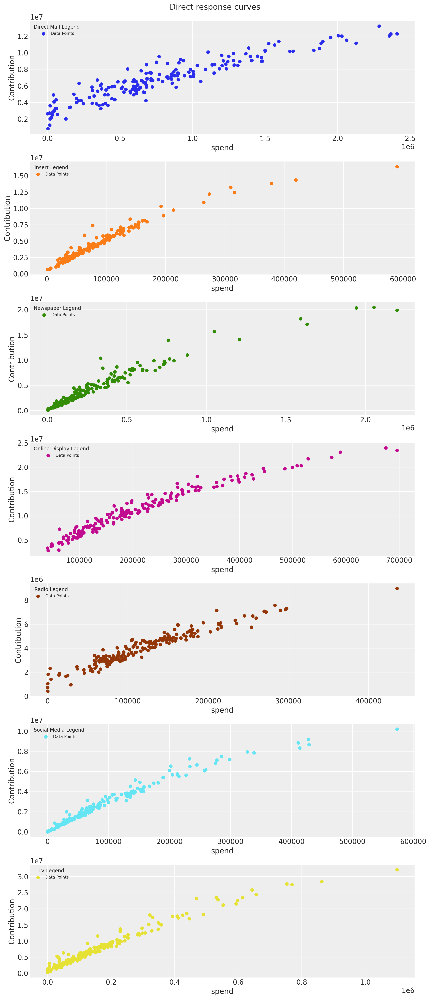

In [29]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="spend") for ax in fig.axes];

The plots show: all channels have a positive spend→contribution relationship, but the slope typically flattens at higher spend (diminishing returns), meaning the next dollar yields less incremental lift once spend is already high. Channels whose dots start flattening sooner are closer to saturation (lower marginal returns at high spend), while channels with a more linear rise still have more headroom.

These curves can be a strong input for marketing planning: they can guide next-period budget setting and a first-pass manual allocation across channels based on where each channel begins to saturate (diminishing marginal returns). This is often a practical way to start discussions with stakeholders and align on plausible spend ranges. Beyond manual tuning, more rigorous budget decisions can be made using custom optimization routines, as described in the following sections.


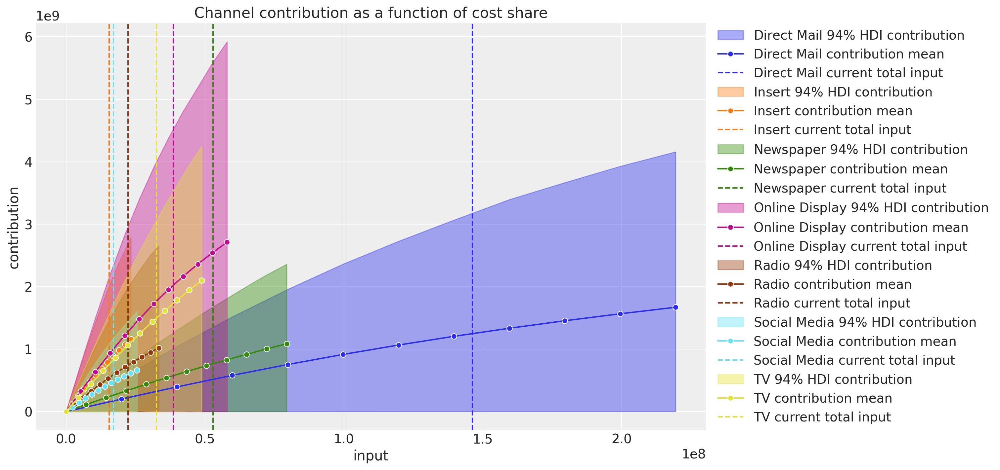

In [31]:
mmm.plot_channel_contribution_grid(
    start=0, stop=1.5, num=12, absolute_xrange=True, figsize=(15, 7)
);

The vertical lines show the spend from the observed data (i.e. 
 above). This plot clearly shows that, for example, Direct Mail is won’t have much incremental contribution if we keep increasing the spend. On the other hand, channels like Online Display and Insert seem to be good candidates to increase the spend. 

 The best place to reallocate budget is typically from channels that are already flattening (low marginal gain) toward channels that are still in the steeper part of the curve (higher marginal gain), while respecting uncertainty and business constraints.

# Return on Ads Spend (ROAS)
To have a more quantitative metric of efficiency we compute the Return on Ads Spend (ROAS) over the whole training period.

To begin lets plot the contribution share for each channel.

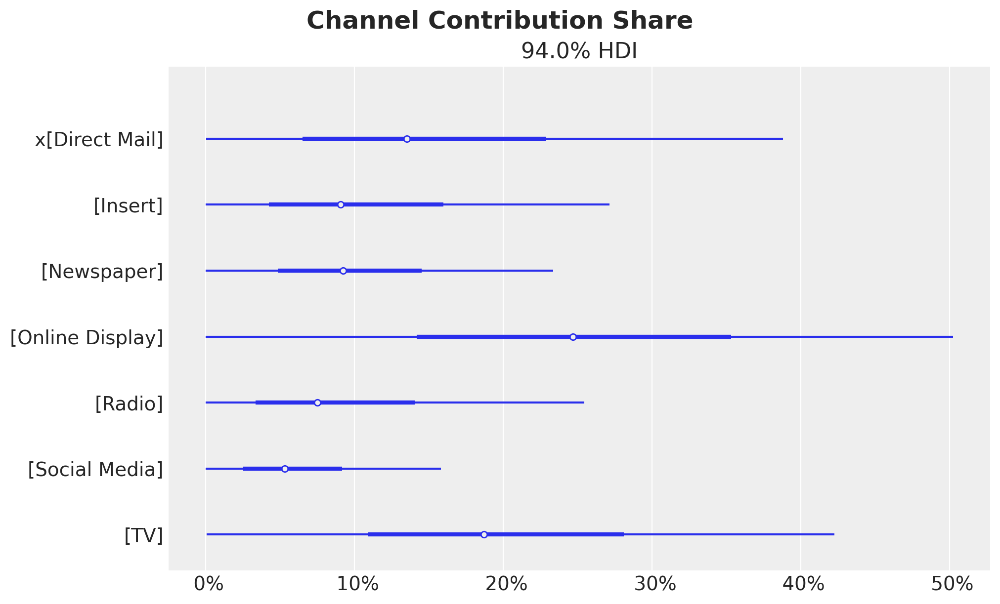

In [34]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

This shows each channel’s share of total modeled media-driven contribution over the training period. The dot is the posterior mean share, and the horizontal line is the 94% credible interval (uncertainty). Channels whose dots are farther right are attributed a larger portion of incremental sales; wide intervals mean the model is less certain about that share (often due to correlated channels or limited variation).


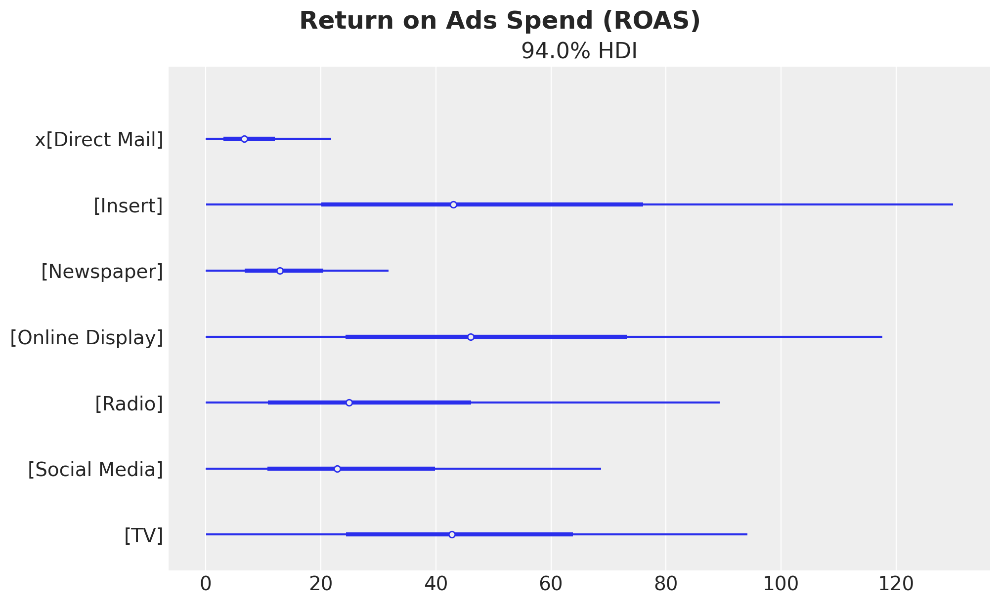

In [35]:
# Get the channel contributions on the original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Sum the contributions over the whole training period
spend_sum = X_train[channel_columns].sum().to_numpy()
spend_sum = spend_sum[
    np.newaxis, np.newaxis, :
]  # We need these extra dimensions to broadcast the spend sum to the shape of the contributions.

# Compute the ROAS as the ratio of the mean contribution and the spend for each channel
roas_samples = channel_contribution_original_scale.sum(dim="date") / spend_sum

# Plot the ROAS
fig, ax = plt.subplots(figsize=(10, 6))
az.plot_forest(roas_samples, combined=True, ax=ax)
fig.suptitle("Return on Ads Spend (ROAS)", fontsize=18, fontweight="bold");

This plot shows efficiency, not size: ROAS is computed as (total contribution attributed to the channel) ÷ (total spend for that channel) over the period. The dot is the posterior mean ROAS, and the line is the 94% credible interval. Channels farther right have higher estimated return per dollar spent, but wide intervals indicate high uncertainty—so rankings shouldn’t be treated as definitive unless intervals are clearly separated.
Here we see that the channels with the highest ROAS on average are Online Display and Insert whereas Direct Mail has the lowest ROAS. This is consistent with the previous findings analyzing the direct and global response curves.

The large HDI intervals for the ROAS for the top channels come from the fact that the spend share of them during the training period is relatively small. Event though we use the spend share as priors, the overall spend levels are also reflected in the estimate (see for example how small the HDI is for Direct Mail).

It is also useful to compare the ROAS and the contribution share.

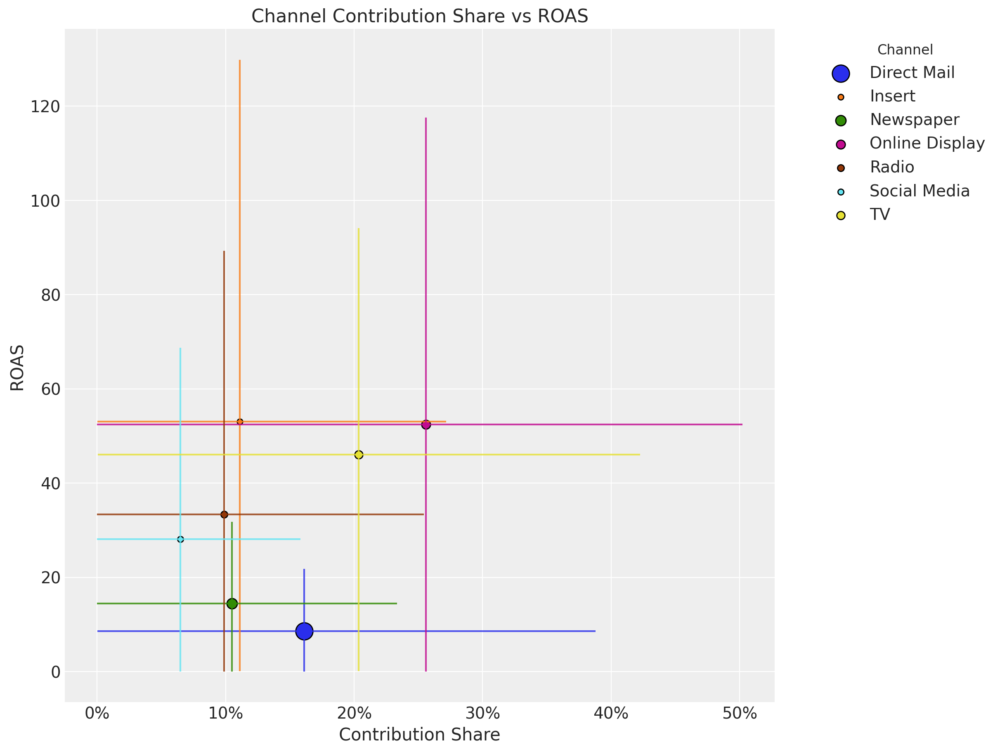

In [36]:
# Get the contribution share samples
share_samples = mmm.get_channel_contribution_share_samples()

fig, ax = plt.subplots(figsize=(12, 9))

for i, channel in enumerate(channel_columns):
    # Contribution share mean and hdi
    share_mean = share_samples.sel(channel=channel).mean().to_numpy()
    share_hdi = az.hdi(share_samples.sel(channel=channel))["x"].to_numpy()

    # ROAS mean and hdi
    roas_mean = roas_samples.sel(channel=channel).mean().to_numpy()
    roas_hdi = az.hdi(roas_samples.sel(channel=channel))["x"].to_numpy()

    # Plot the contribution share hdi
    ax.vlines(share_mean, roas_hdi[0], roas_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the ROAS hdi
    ax.hlines(roas_mean, share_hdi[0], share_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the means
    ax.scatter(
        share_mean,
        roas_mean,
        # Size of the scatter points is proportional to the spend share
        s=5 * (spend_shares[i] * 100),
        color=f"C{i}",
        edgecolor="black",
        label=channel,
    )
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

ax.legend(
    bbox_to_anchor=(1.05, 1), loc="upper left", title="Channel", title_fontsize=12
)
ax.set(
    title="Channel Contribution Share vs ROAS",
    xlabel="Contribution Share",
    ylabel="ROAS",
);

# Out-of-Sample Predictions
So far, the model fit has been evaluated only in-sample. To rely on the model’s recommendations, there must be evidence that it not only explains historical patterns but also predicts unseen data. This step validates generalization by producing out-of-sample (test) forecasts from the fitted MMM and comparing them against actual test sales. The 50% and 94% credible intervals quantify predictive uncertainty and show whether the observed outcomes fall within a reasonable range of the model’s predictions.


In [37]:
y_pred_test = mmm.sample_posterior_predictive(
    X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

We can visualize and compare the in sample and out of sample predictions.

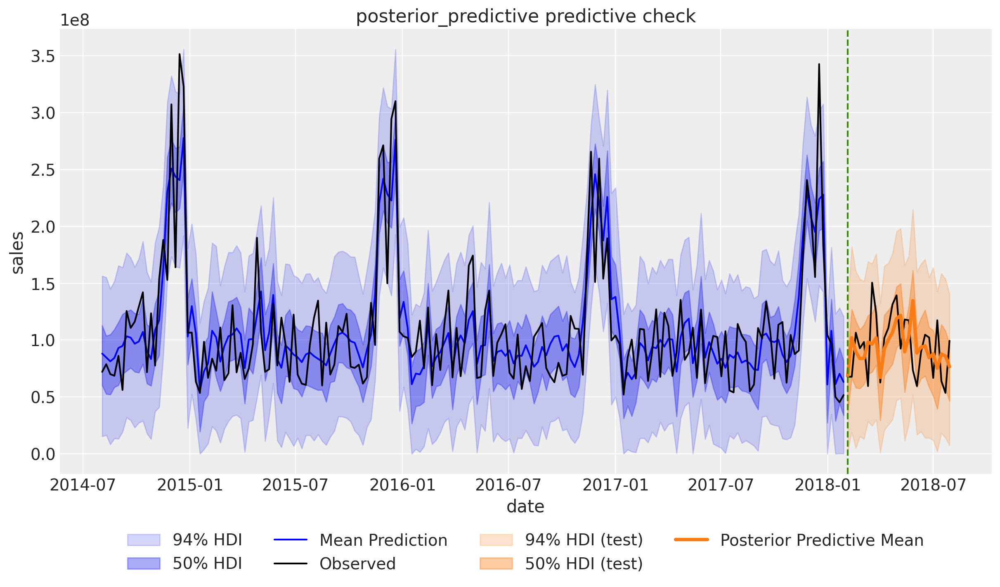

In [38]:
fig, ax = plt.subplots()
mmm.plot_posterior_predictive(original_scale=True, ax=ax)

test_hdi_94 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.94)
test_hdi_50 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.50)

ax.fill_between(
    X_test[date_column],
    test_hdi_94[:, 0],
    test_hdi_94[:, 1],
    color="C1",
    label=f"{0.94:.0%} HDI (test)",
    alpha=0.2,
)

ax.fill_between(
    X_test[date_column],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} HDI (test)",
    alpha=0.4,
)

ax.plot(X_test[date_column], y_test, color="black")
ax.plot(
    X_test[date_column],
    y_pred_test["y"].mean(dim="sample"),
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.axvline(X_test[date_column].iloc[0], color="C2", linestyle="--")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(ylabel="sales");

the model’s forecast mean in the test window tracks the observed level reasonably well, and most observed points fall inside the orange uncertainty bands, suggesting the MMM generalizes decently out-of-sample (with uncertainty naturally widening in the forecast region).
Let’s zoom in the out-of-sample predictions:

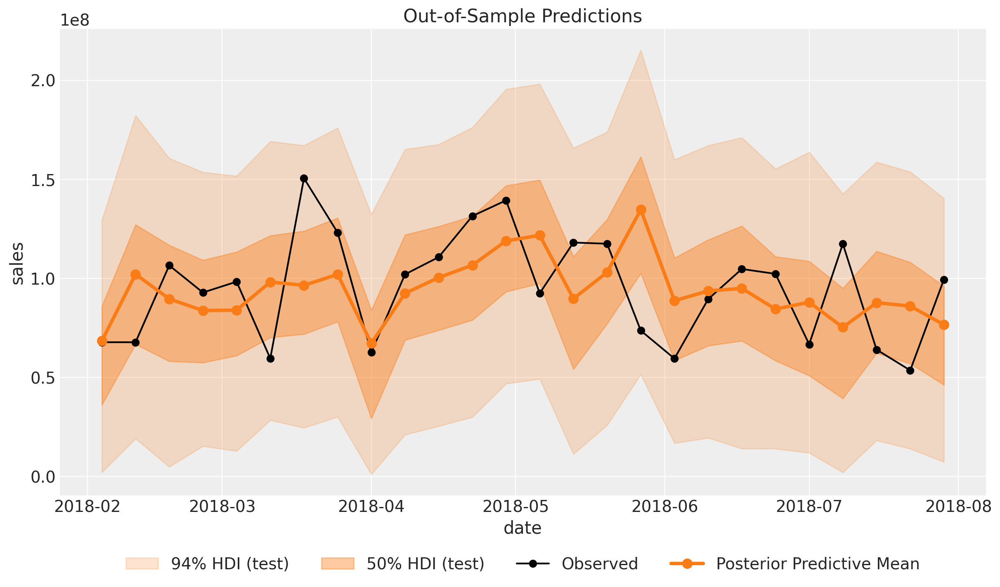

In [39]:
fig, ax = plt.subplots()
ax.fill_between(
    X_test[date_column],
    test_hdi_94[:, 0],
    test_hdi_94[:, 1],
    color="C1",
    label=f"{0.94:.0%} HDI (test)",
    alpha=0.2,
)
ax.fill_between(
    X_test[date_column],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} HDI (test)",
    alpha=0.4,
)
ax.plot(X_test[date_column], y_test, marker="o", color="black", label="Observed")
ax.plot(
    X_test[date_column],
    y_pred_test["y"].mean(dim="sample"),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title="Out-of-Sample Predictions", xlabel="date", ylabel="sales");

These look actually very good!

To have a concrete score metric we can use the Continuous Ranked Probability Score (CRPS). This is a generalization of the mean absolute error to the case of probabilistic predictions. CRPS is a metric for evaluating probabilistic forecasts (a full predictive distribution, not just a single point). It measures how close the model’s predicted distribution is to the observed value; lower CRPS is better because it rewards forecasts that are both accurate and well-calibrated (sharp but not overconfident).

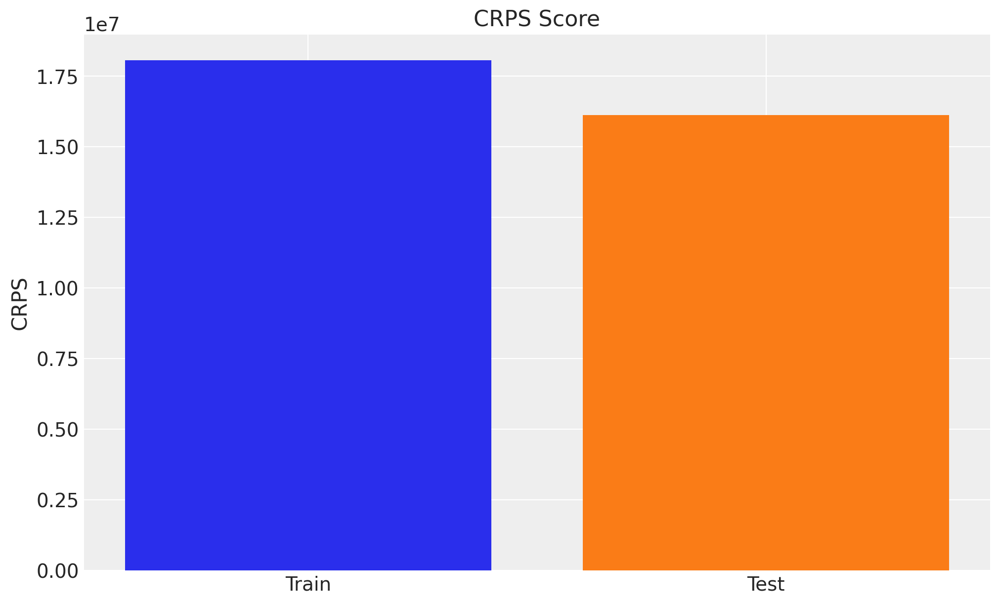

In [40]:
crps_train = crps(
    y_true=y_train.to_numpy(),
    y_pred=az.extract(mmm.idata["posterior_predictive"], var_names=["y"]).T,
)

crps_test = crps(y_true=y_test.to_numpy(), y_pred=y_pred_test["y"].T)

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(["Train", "Test"], [crps_train, crps_test], color=["C0", "C1"])
ax.set(ylabel="CRPS", title="CRPS Score");

Interestingly enough, the model performance is better in the test set. There could me many reasons for it:
- The model is not capturing the end of the seasonality very well in the training set.
- There is less variability or complexity in the test set data.
- The test set has fewer points, which could affect the CRPS calculation comparison.

Because a single train/test split can give a misleading CRPS comparison.

- CRPS depends on which time window ends up in “train” vs “test.” If the test period is calmer (less volatile), it can look “better” even if the model isn’t truly more generalizable.
- MMM is time-series: relationships (media effectiveness, baseline, seasonality, noise) can drift over time. One split doesn’t tell whether performance is stable across different periods.
- Test is often smaller (fewer weeks), so the average CRPS can be noisier and less comparable.

Time-slice cross-validation fixes this by repeatedly training on an earlier window and forecasting the next window across multiple folds. That gives a fairer “apples-to-apples” view of out-of-sample performance across time and helps check parameter stability (whether channel effects stay consistent from fold to fold).


**Looking into out-of-sample channel contributions:**
The goal of looking at out-of-sample channel contributions is to check whether the MMM’s attribution/decomposition is stable and plausible on new data, not just in-sample: i.e., when the model forecasts future sales, do the implied channel contributions (timing, magnitude, variability) still make sense, and do they remain consistent enough to trust for decisions like budget shifts and scenario planning.

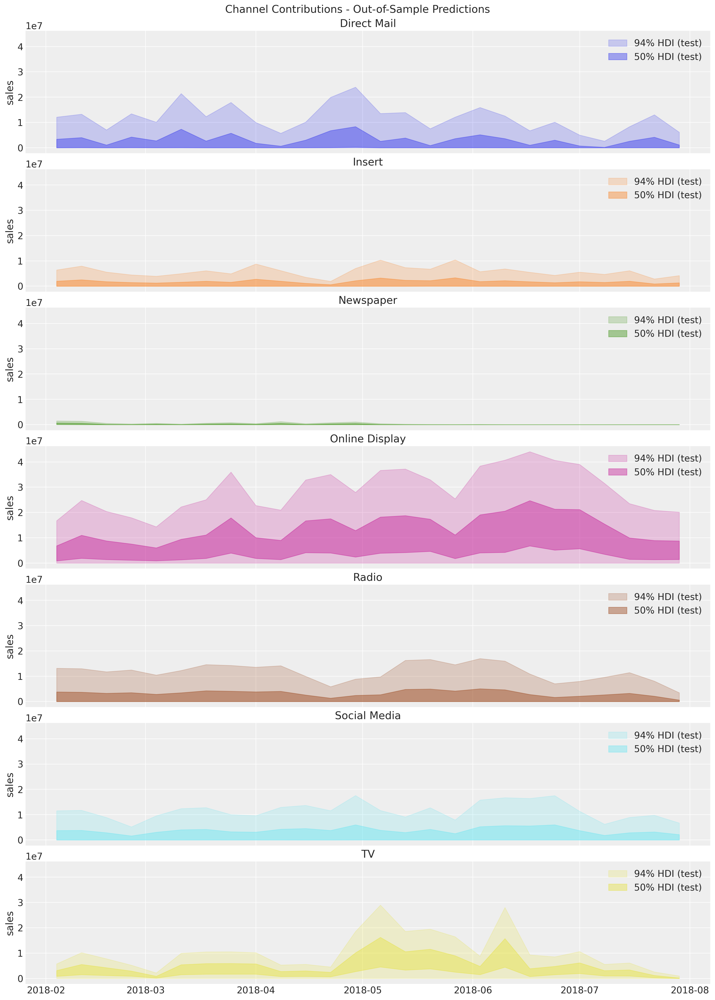

In [41]:
fig, axes = plt.subplots(
    nrows=len(channel_columns),
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=True,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    for j, hdi_prob in enumerate([0.94, 0.5]):
        ax = axes[i]
        az.plot_hdi(
            X_test[date_column],
            y_pred_test["channel_contribution"]
            .sel(channel=channel)
            .unstack()
            .transpose(..., "date"),
            hdi_prob=hdi_prob,
            color=f"C{i}",
            smooth=False,
            fill_kwargs={"alpha": 0.2 + 0.2 * j, "label": f"{hdi_prob:.0%} HDI (test)"},
            ax=ax,
        )
    ax.legend(loc="upper right")
    ax.set(title=channel, ylabel="sales")

fig.suptitle("Channel Contributions - Out-of-Sample Predictions", fontsize=16);

We do not have the true values contributions to compare against because this is what we are trying to estimate on the first place. Nevertheless, we can still do the time slice cross validation at the channel level to analyze the stability of the out-of-sample predictions and media parameters (adstock and saturation).
These plots show the estimated channel-by-channel sales contributions in the test period (out-of-sample). Each small panel is one channel (Direct Mail, Insert, Newspaper, Online Display, Radio, Social Media, TV), and the shaded bands are the model’s posterior uncertainty for that channel’s contribution over time (dark = 50% HDI, light = 94% HDI). Visually, channels with higher panels/spikes are the ones the model thinks drove more incremental sales during those test weeks, while wide bands indicate higher uncertainty.

# Budget Optimization
In this las section we explain how to use PyMC-Marketing to perform optimization of the media budget allocation. The main idea is to use the response curves to optimize the spend. For more details see Budget Allocation with PyMC-Marketing notebook.

# Optimization Procedure
let us assume we want to re-allocate the budget of the tests set. The PyMC-Marketing MMM optimizer would assume we will equally allocate the budget to all channels over the next num_periods periods. Hence, when we specify the budget variable we are actually specifying the weekly budget (in this case). Therefore, it is important to understand the past average weekly spend per channel:
This line sums the spend for each marketing channel across all dates in the test set, returning one total per channel (e.g., total TV, total Radio, etc. over the whole test period). It’s used to understand how much budget was actually spent per channel during the test window so that the budget optimizer can treat that amount as the available budget to reallocate (often converted into an average per-period budget).

In [42]:
X_test[channel_columns].sum(axis=0)

Direct Mail       12107275.13
Insert             1065383.05
Newspaper           273433.16
Online Display     6498301.30
Radio              3384098.82
Social Media       4298913.23
TV                 2610543.53
dtype: float64

- First, the model is evaluated on the test period (out-of-sample) to confirm it can predict reasonably well.
- Then computes the total spend per channel during that test window.
- That total is treated as the budget constraint (often converted to a per-period/weekly budget) for the optimization step.
- Budget allocation then answers: “If the total budget for the next N periods is fixed (like it was in the test set), how should it be redistributed across channels to maximize expected sales/conversions given the learned response curves?”

In [43]:
num_periods = X_test[date_column].shape[0]

# Total budget for the test set per channel
all_budget_per_channel = X_test[channel_columns].sum(axis=0)

# Total budget for the test set
all_budget = all_budget_per_channel.sum()

# Weekly budget for each channel
# We are assuming we do not know the total budget allocation in advance
# so this would be the naive "uniform" allocation.
per_channel_weekly_budget = all_budget / (num_periods * len(channel_columns))

Let’s plot the average weekly spend per channel for the actual test set.



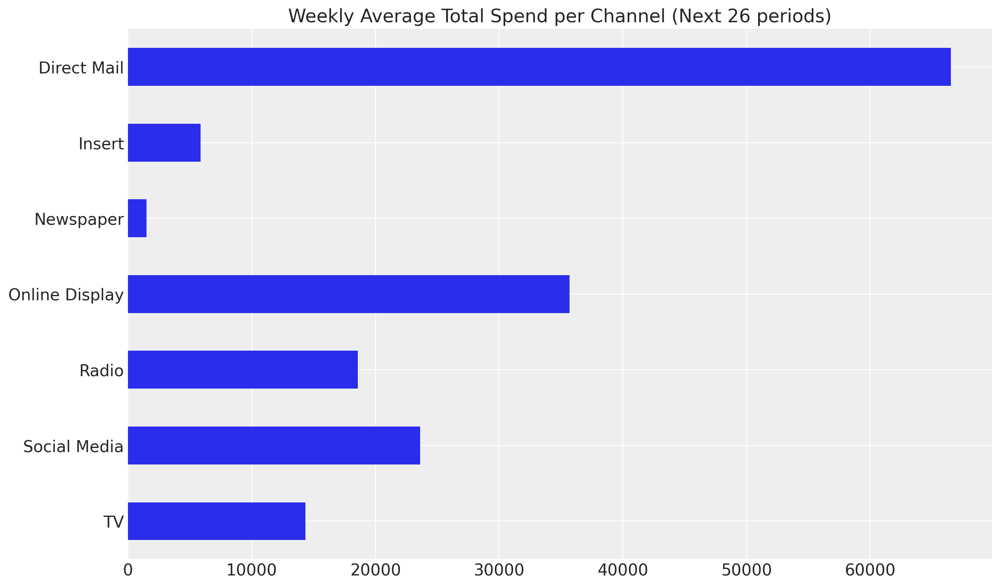

In [44]:
fig, ax = plt.subplots()
(
    all_budget_per_channel.div(num_periods * len(channel_columns))
    .sort_index(ascending=False)
    .plot.barh(color="C0", ax=ax)
)
ax.set(title=f"Weekly Average Total Spend per Channel (Next {num_periods} periods)");

Observe that the spend distribution on the test set is considerably different from the train set. When planning future spends, this is usually the case as the team might be exploring new investment opportunities. For example that in the test set we have on average more spend on Online Display while less spend on Insert, both with high ROAS from the training data.

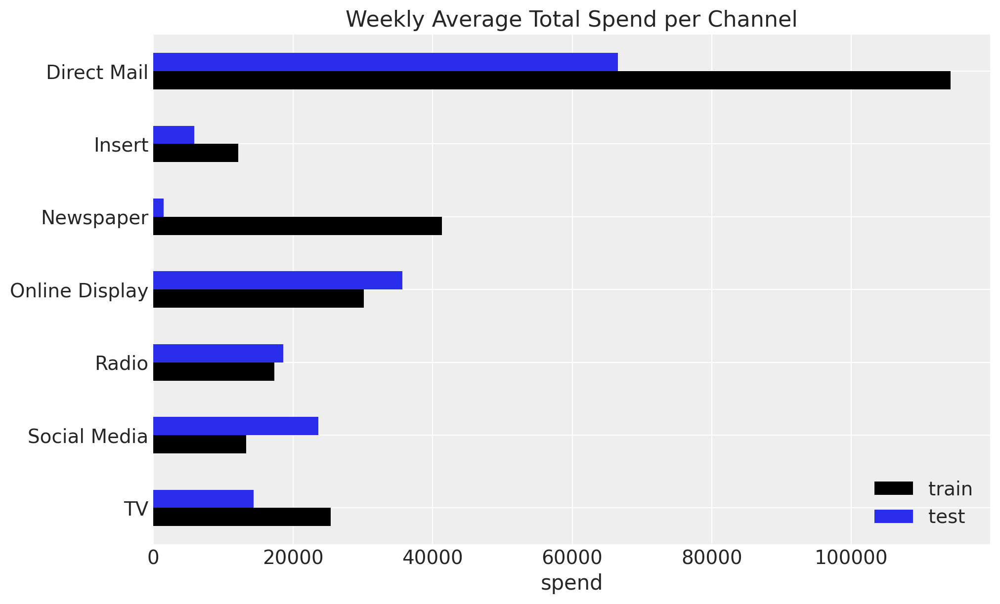

In [45]:
average_spend_per_channel_train = X_train[channel_columns].sum(axis=0) / (
    X_train.shape[0] * len(channel_columns)
)

average_spend_per_channel_test = X_test[channel_columns].sum(axis=0) / (
    X_test.shape[0] * len(channel_columns)
)

fig, ax = plt.subplots(figsize=(10, 6))
average_spend_per_channel_train.to_frame(name="train").join(
    other=average_spend_per_channel_test.to_frame(name="test"),
    how="inner",
).sort_index(ascending=False).plot.barh(color=["black", "C0"], ax=ax)
ax.set(title="Weekly Average Total Spend per Channel", xlabel="spend");

- Direct Mail dominates spend in both, but it’s much higher in train than in test.
- Newspaper is high in train but almost zero in test (big shift away from Newspaper in the test period).
- Online Display is higher in test than in train (budget shifted toward digital).
- Social Media and Radio are also higher in test than in train.
- TV is higher in train than in test.
- Insert is relatively small, but higher in train than in test.

Next, consider the practical variability of the allocation. Even if the model identifies Insert as the most efficient channel, it is rarely realistic to shift an outsized share of the total budget into a single channel. A more stakeholder-friendly approach is to introduce controlled flexibility by setting per-channel lower and upper bounds, ensuring the optimized plan stays within reasonable limits.
In this example, each channel is allowed to move within a ±50% range relative to its historical average weekly spend.

In [46]:
# means ±50% flexibility around the baseline spend.
percentage_change = 0.5
# Computes a baseline average spend level from the test period (used as a reference point).
mean_spend_per_period_test = (
    X_test[channel_columns].sum(axis=0).div(num_periods * len(channel_columns))
)

# creates lower/upper bounds for each channel so the optimizer can’t push all money into one “best” channel.
budget_bounds = {
    key: [(1 - percentage_change) * value, (1 + percentage_change) * value]
    for key, value in (mean_spend_per_period_test).to_dict().items()
}

Now we are ready to pass all this business requirements to the optimizer.



In [47]:
# mmm.optimize_budget() finds an allocation strategy (spend per channel per week) that maximizes expected outcome (e.g., sales) subject to:
# total weekly budget (budget_per_channel_weekly_budget),
# number of periods (num_periods),
# per-channel bounds (budget_bounds)
# It uses SLSQP with a tight tolerance and many iterations.
# SLSQP : Sequential Least Squares Programming — a constrained optimization algorithm that finds the best values while respecting constraint

model_granularity = "weekly"
allocation_strategy, optimization_result = mmm.optimize_budget(
    budget=per_channel_weekly_budget,
    num_periods=num_periods,
    budget_bounds=budget_bounds,
    minimize_kwargs={
        "method": "SLSQP",
        "options": {"ftol": 1e-9, "maxiter": 5_000},
    },
)

# simulates the distribution of predicted sales under the optimized plan (adds a small noise_level=0.05) 
# so results come with uncertainty, not just one number.
response = mmm.sample_response_distribution(
    allocation_strategy=allocation_strategy,
    time_granularity=model_granularity,
    num_periods=num_periods,
    noise_level=0.05,
)

C:\Users\Taha\AppData\Local\Temp\ipykernel_20328\2689741998.py:2: DeprecationWarning: This method is deprecated and will be removed in a future version. Please migrate to the `Multidimensal.MMM` class.
  allocation_strategy, optimization_result = mmm.optimize_budget(
C:\Users\Taha\anaconda3\envs\marketing311\Lib\site-packages\pymc_marketing\mmm\budget_optimizer.py:745: UserWarning: Using default equality constraint
  self.set_constraints(


Visualize the results.

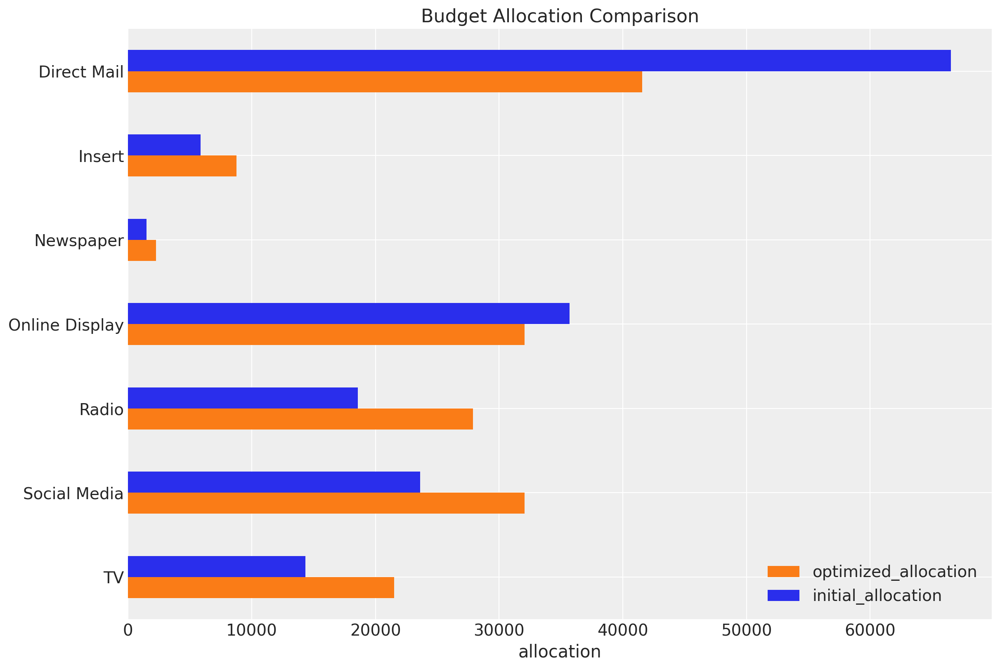

In [48]:
fig, ax = plt.subplots()

contribution_comparison_df = (
    pd.Series(allocation_strategy, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
)
contribution_comparison_df.plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
ax.set(title="Budget Allocation Comparison", xlabel="allocation");

This chart compares current (initial) budget allocation vs the optimized allocation recommended by the MMM optimizer (given the total budget + bounds).
What it’s saying here:
- Direct Mail: recommended decrease (This is consistent with the previous findings that this channel is not very efficient).
- Online Display: slight decrease.
- Insert, Radio, Social Media, TV: recommended increase (money is shifted toward channels the model thinks have more remaining marginal return under the constraints).
- Newspaper: small and roughly similar (low weight either way).
- Online Display: slight decreaseOnline Display already got more budget in the test period than it had during training (the “starting point” for optimization is already higher). Because of saturation/diminishing returns, once spend is higher, each extra dollar tends to add less incremental sales. So the model suggests a small cut to Online Display and reallocates that money to other channels

We verify that the sum of the budget allocation is the same as the initial budget.

In [49]:
np.testing.assert_allclose(
    mean_spend_per_period_test.sum(), allocation_strategy.sum().item()
)

We can also obtain the average expected contributions per channel with the new budget allocation.



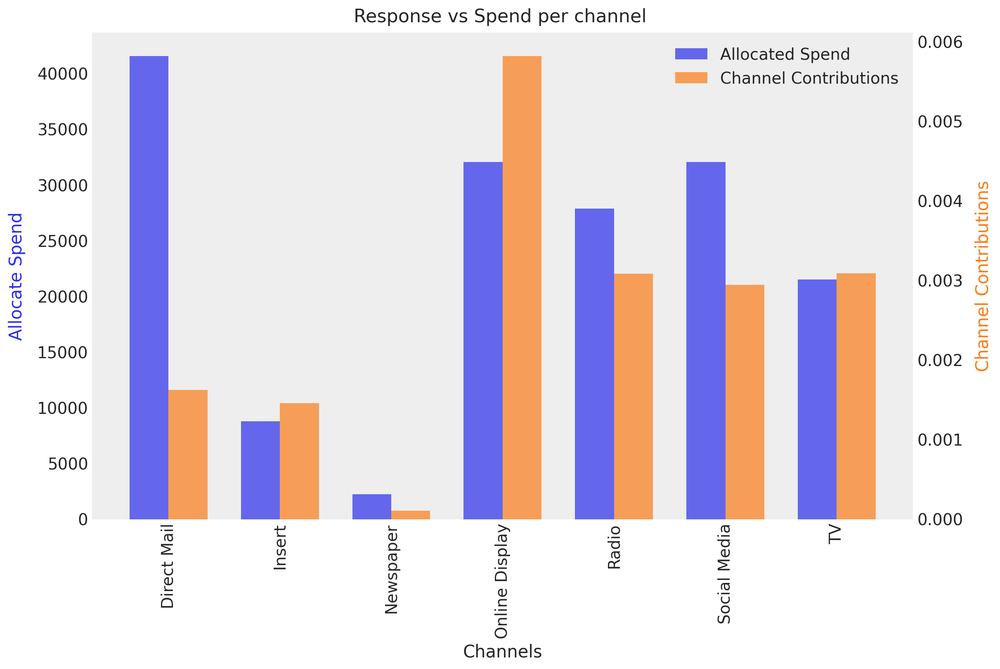

In [50]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
fig.suptitle("Response vs Spend per channel", fontsize=16);

# In-Sample Optimization Results
**Goal**: Evaluate a counterfactual scenario: how sales would change if the training-period spend mix were adjusted to match the optimized allocation (while keeping the MMM parameters fixed). Produce an estimated uplift (and uncertainty) compared to the original allocation.

**Steps**
- Compute the optimizer share per channel and the original share per channel (from the baseline/initial allocation).
- Compute a multiplier = optimized_share / initial_share.
- That multiplier is applied to each channel’s spend time series in the training set.

(re-weighted) training spend becomes a “what-if” scenario:
- Take the original training media spends (by week, by channel).
- Multiply each channel’s weekly spend by its multiplier → produces a new training spend matrix that reflects the optimized mix.
- Feed this new spend matrix into the fitted MMM to simulate/predict sales under that optimized allocation (typically via posterior predictive / response distribution).
- Compare the predicted outcome under optimized allocation vs the original allocation to estimate expected uplift (with uncertainty).

In [51]:
shares_comparison_df = contribution_comparison_df / contribution_comparison_df.sum(
    axis=0
)

shares_comparison_df = shares_comparison_df.assign(
    # We can compute the multiplier as the ratio of the optimized to the initial allocation.
    # This will be used to re-weight the original training data.
    multiplier=lambda df: df["optimized_allocation"] / df["initial_allocation"]
)

shares_comparison_df

,optimized_allocation,initial_allocation,multiplier
TV,0.129500,0.086333,1.500000
Social Media,0.192957,0.142169,1.357229
Radio,0.167873,0.111916,1.500000
Online Display,0.192957,0.214905,0.897867
Newspaper,0.013564,0.009043,1.500000
Insert,0.052850,0.035233,1.500000
Direct Mail,0.250299,0.400400,0.625123


We now re-weight the original training data with the optimized allocation distribution. It is very important to ensure the total spend is the same as in the original data (we do this by normalizing the total spend in the optimized data to be the same as in the original data).



In [52]:
X_train_weighted = X_train.copy()

# We re-weight the original training data with the optimized allocation distribution.
for channel in channel_columns:
    channel_multiplier = shares_comparison_df[shares_comparison_df.index == channel][
        "multiplier"
    ].item()
    X_train_weighted[channel] = X_train_weighted[channel] * channel_multiplier

# We normalize the total spend in the optimized data to be the same as in the original data.
normalization_factor = (
    X_train[channel_columns].sum().sum() / X_train_weighted[channel_columns].sum().sum()
)

# We apply the normalization factor to the optimized data.
X_train_weighted[channel_columns] = (
    X_train_weighted[channel_columns] * normalization_factor
)

# We validate that the total spend is the same as in the original data.
assert (  # noqa: S101
    X_train_weighted[channel_columns].sum().sum()
    == X_train[channel_columns].sum().sum()
)

We can now visualize the original and optimized training data.



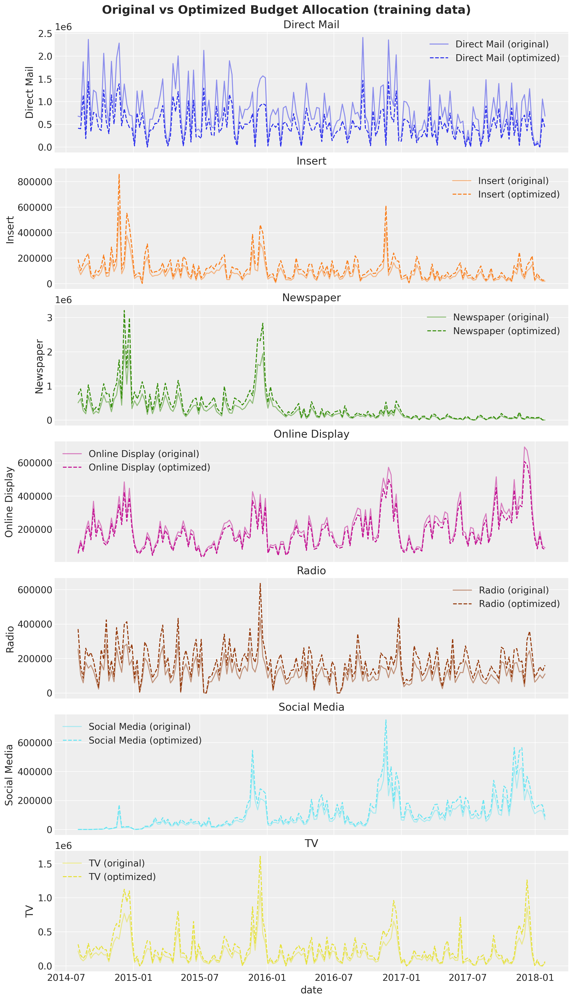

In [53]:
fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(12, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    sns.lineplot(
        data=X_train,
        x=date_column,
        y=channel,
        color=f"C{i}",
        label=f"{channel} (original)",
        alpha=0.5,
        ax=ax,
    )
    sns.lineplot(
        data=X_train_weighted,
        x=date_column,
        y=channel,
        color=f"C{i}",
        linestyle="--",
        label=f"{channel} (optimized)",
        ax=ax,
    )
    ax_twin.grid(None)
    ax.set(title=f"{channel}")

ax.set_xlabel("date")

fig.suptitle(
    "Original vs Optimized Budget Allocation (training data)",
    fontsize=18,
    fontweight="bold",
);

The panels compare original training-week spend vs a counterfactual “optimized” spend path created by re-weighting the training data with the optimizer’s allocation shares.
- If the dashed line is consistently above the solid line for a channel, the optimizer is recommending more budget for that channel (higher share. Like insert).
- If the dashed line is consistently below the solid line, the optimizer is recommending less budget for that channel (lower share. like Direct mail).
- The time pattern (spikes/seasonality) stays similar because the method scales the original series—so it’s a “same schedule, different mix” scenario rather than a brand-new flighting plan.


Next, we compute the posterior predictive for the original and optimized data.


In [54]:
y_pred_train = mmm.sample_posterior_predictive(
    X_train,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

y_pred_train_weighted = mmm.sample_posterior_predictive(
    X_train_weighted,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Finally, we can compare the original and optimized posterior predictive distributions. First we look at the channel contributions level.



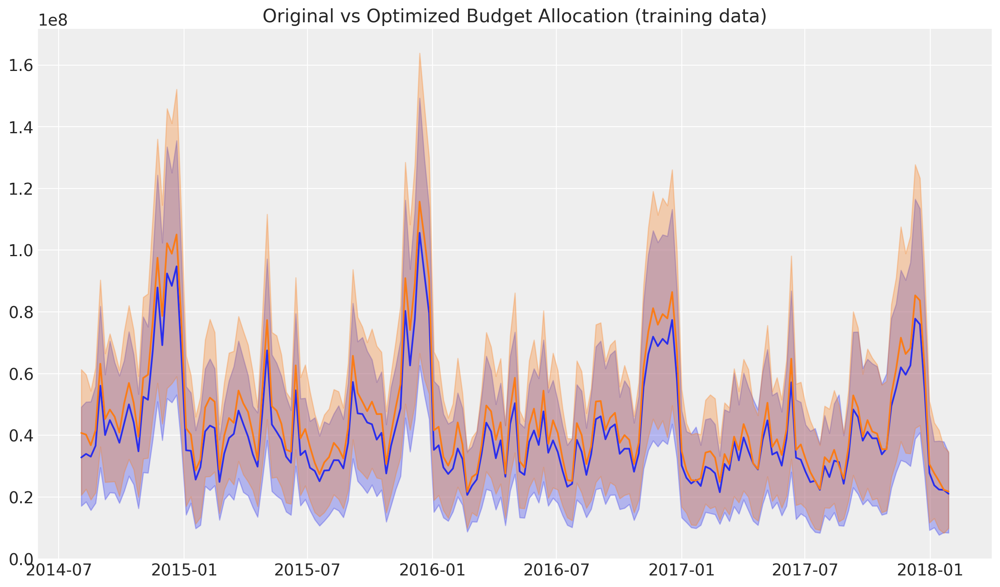

In [55]:
fig, ax = plt.subplots()

az.plot_hdi(
    y_pred_train.date,
    y_pred_train["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel"),
    smooth=False,
    color="C0",
    fill_kwargs={"alpha": 0.3},
    ax=ax,
)

ax.plot(
    y_pred_train.date,
    y_pred_train["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel")
    .mean(dim=("chain", "draw")),
    color="C0",
)

az.plot_hdi(
    y_pred_train_weighted.date,
    y_pred_train_weighted["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel"),
    smooth=False,
    color="C1",
    fill_kwargs={"alpha": 0.3},
    ax=ax,
)

ax.plot(
    y_pred_train_weighted.date,
    y_pred_train_weighted["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel")
    .mean(dim=("chain", "draw")),
    color="C1",
)

ax.set_title("Original vs Optimized Budget Allocation (training data)", fontsize=16);


This plot compares the model’s predicted total sales (or total contribution) over the training period under two scenarios: the original budget mix versus the optimizer’s reweighted (optimized) mix, while keeping total spend the same. The optimized curve and its uncertainty band generally sit above the original one, indicating the model expects higher outcomes under the optimized allocation, and the shaded credible-interval bands show how certain that uplift is (more overlap means less certainty, more separation means stronger evidence). The goal is an in-sample “what-if” check to estimate the expected uplift and its uncertainty before using the optimized allocation for future budgeting.

It is clear that the optimized allocation has a higher contribution level. We can quantify this by computing the uplift in the channel contributions.


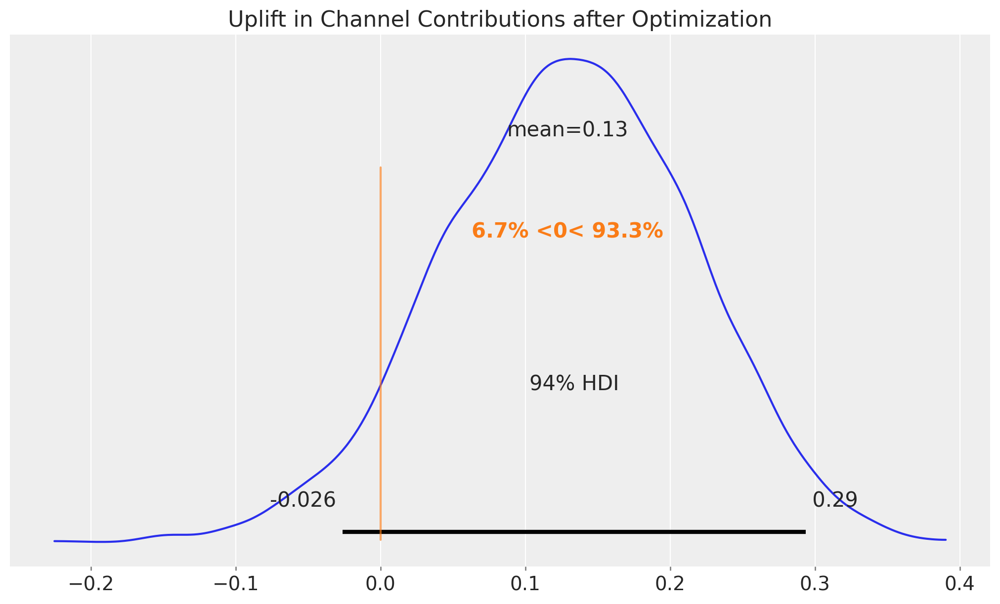

In [56]:
uplift = (
    y_pred_train_weighted["channel_contribution"].sum(dim=("date", "channel")).unstack()
    / y_pred_train["channel_contribution"].sum(dim=("date", "channel")).unstack()
) - 1

fig, ax = plt.subplots(figsize=(10, 6))
az.plot_posterior(uplift, var_names=["channel_contribution"], ref_val=0, ax=ax)
ax.set_title("Uplift in Channel Contributions after Optimization", fontsize=16);

This figure is a posterior distribution of the “uplift” after budget optimization—i.e., how much higher the model expects the outcome (sales / total media contribution) to be under the optimized allocation compared with the original allocation, given the same total spend.

- Blue curve: all plausible uplift values implied by the Bayesian posterior (one value per posterior draw).
- mean = 0.13: the average uplift is about +0.13 (often interpreted as ~+13% if uplift is defined as a relative lift).
- Orange vertical line at 0: “no change” (optimized = original).
- “6.7% < 0 < 93.3%”: about 93.3% probability the uplift is positive, and 6.7% probability it’s negative (i.e., optimization hurts).
- 94% HDI (black bar): the credible interval for uplift (here roughly -0.026 to 0.29), meaning the most credible 94% of uplift values lie in that range.

So the takeaway: the optimizer is expected to improve performance on average, and the posterior suggests that improvement is very likely (most of the mass is to the right of zero), though there’s still some uncertainty because the HDI slightly crosses 0.We see that the uplift is around 
, which is quite significant in view of the typical figures in marketing spend. This would have made our media much spend much more efficient.

Finally, we can look at the uplift in sales.

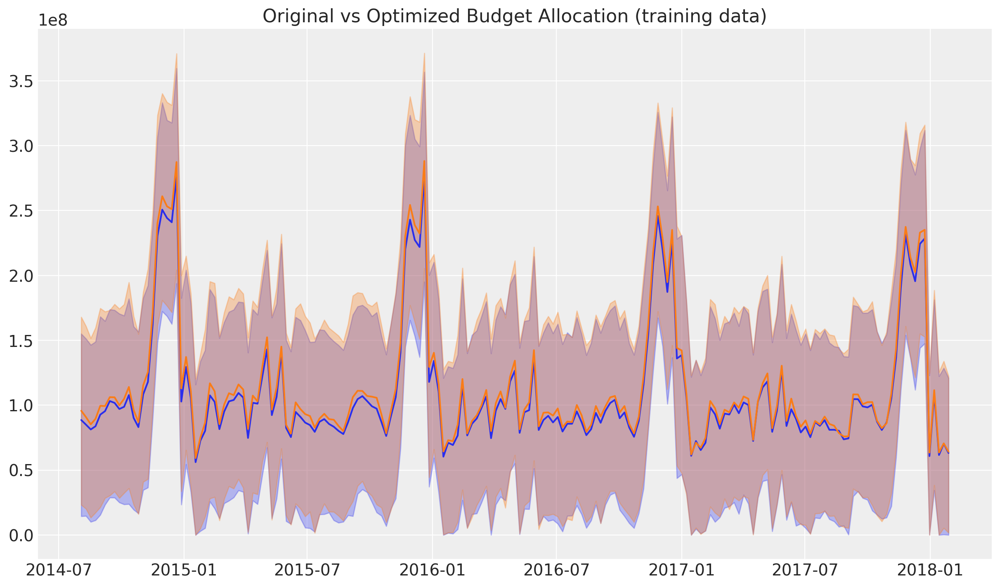

In [57]:
fig, ax = plt.subplots()

az.plot_hdi(
    y_pred_train.date,
    y_pred_train["y"].unstack().transpose(..., "date"),
    smooth=False,
    color="C0",
    fill_kwargs={"alpha": 0.3},
    ax=ax,
)

ax.plot(
    y_pred_train.date,
    y_pred_train["y"].unstack().transpose(..., "date").mean(dim=("chain", "draw")),
    color="C0",
)

az.plot_hdi(
    y_pred_train_weighted.date,
    y_pred_train_weighted["y"].unstack().transpose(..., "date"),
    smooth=False,
    color="C1",
    fill_kwargs={"alpha": 0.3},
    ax=ax,
)

ax.plot(
    y_pred_train_weighted.date,
    y_pred_train_weighted["y"]
    .unstack()
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    color="C1",
)

ax.set_title("Original vs Optimized Budget Allocation (training data)", fontsize=16);

- The two lines are the model’s predicted mean sales over time for each scenario (original vs optimized).
- The shaded bands are the model’s uncertainty (credible intervals). Because they’re wide and overlap a lot, the two scenarios can look similar even if there is a real improvement.
this plot shows : Do an in-sample “what-if” simulation:estimate whether the optimized spend mix would have produced higher predicted sales than the original mix, and then quantify the uplift.

We also see an uplift in sales, although the difference is masked by the model uncertainty itself. Neverthless, we can compute the uplift in sales as well.

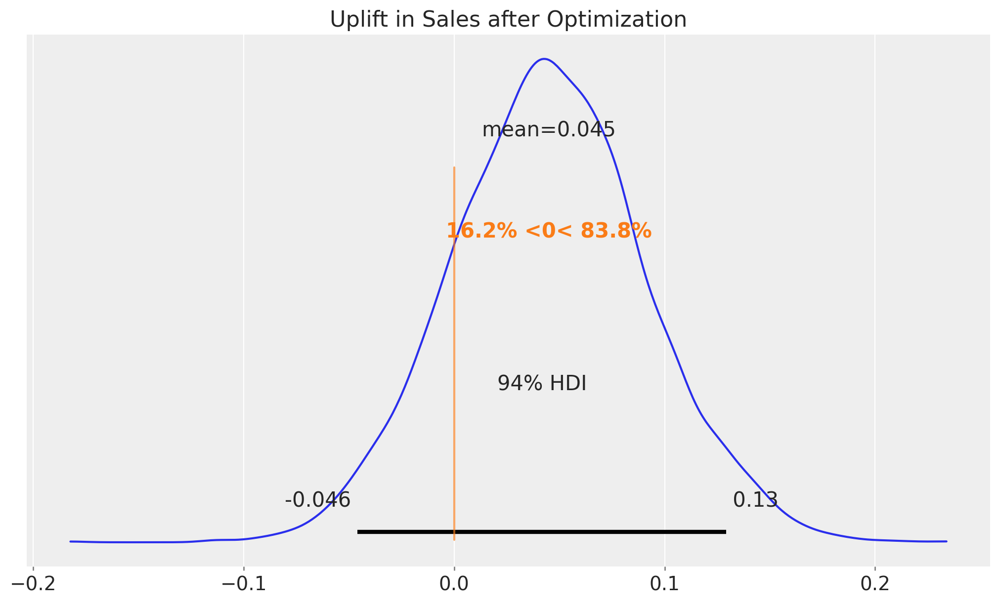

In [58]:
uplift = (
    y_pred_train_weighted["y"].sum(dim=("date")).unstack()
    / y_pred_train["y"].sum(dim=("date")).unstack()
) - 1

fig, ax = plt.subplots(figsize=(10, 6))
az.plot_posterior(uplift, var_names=["y"], ref_val=0, ax=ax)
ax.set_title("Uplift in Sales after Optimization", fontsize=16);

This plot shows the posterior distribution of the percent uplift in total sales after applying the optimized budget allocation (compared to the original allocation), based on the model’s uncertainty.
- mean = 0.045 → average expected lift is about +4.5% in sales.
- 94% HDI (black bar) runs roughly from −4.6% to +13% → most plausible outcomes range from a small decline to a moderate increase.
- The vertical line at 0 is “no change.” The annotation 16.2% < 0 < 83.8% means there is about an 83.8% chance uplift is positive and about a 16.2% chance it is negative.
Overall:Overall, the optimized allocation is more likely to increase sales than not, but the uncertainty remains large enough that a sales decline is still a plausible outcome.
# Out-of-Sample Optimization Results
Now that in-sample performance has been reviewed, attention shifts to the out-of-sample (holdout) window. The same “tune-on-future” optimization used in-sample is not possible here because future outcomes—and many future fluctuations—are unknown at decision time. Instead, evaluation is done by applying a fixed (uniform) allocation strategy across the test period, similar to how a real media plan would be set before results are observed.

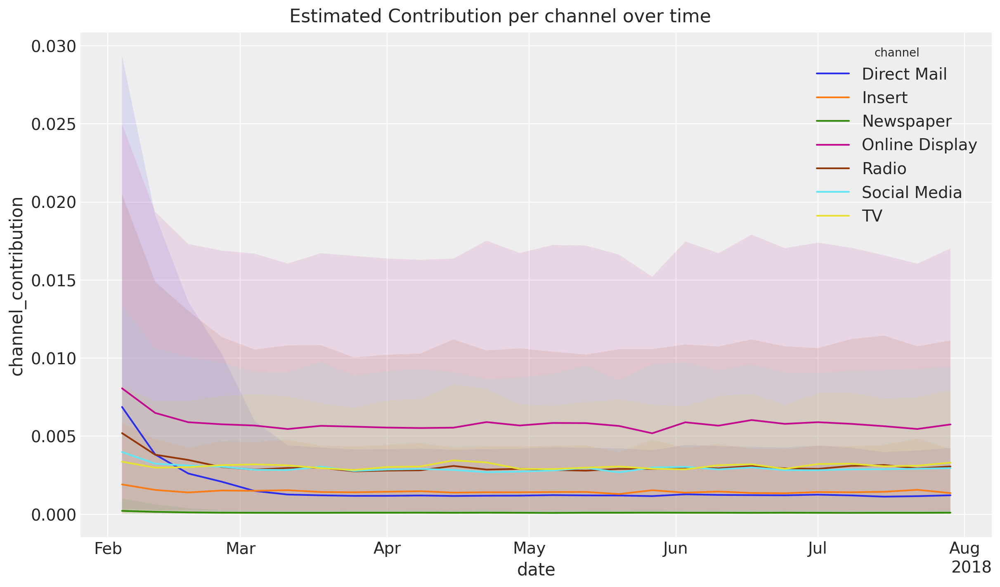

In [59]:
fig = mmm.plot_allocated_contribution_by_channel(samples=response)
fig.suptitle("Estimated Contribution per channel over time", fontsize=16);

This plot summarizes the estimated channel contributions over the out-of-sample window, making it easy to compare which channels are expected to drive more incremental impact and how stable those contributions are—without using future observed outcomes to adjust the allocation.




# Note
Uncertainty typically increases when the recommended spend pushes a channel into a region with limited historical support. For example, if Online Display is assigned a spend level outside (or near the edge of) its past range, the posterior predictive distribution widens to reflect extrapolation risk (visible as a larger uncertainty band).

As in the in-sample analysis, the optimized plan is compared against a baseline (naive) allocation at two levels:

- **Channel contributions**: differences between optimized and baseline channel contributions computed from posterior predictive samples.-
- **Total sales**: differences between optimized and baseline total predicted sales computed from posterior predictive samples. Intercept and seasonality terms are included, while control variables are set to zero when future values are unavailable.

In [60]:
X_actual_uniform = X_test.copy()

for channel in channel_columns:
    X_actual_uniform[channel] = mean_spend_per_period_test[channel]

for control in control_columns:
    X_actual_uniform[control] = 0.0

pred_test_uniform = mmm.sample_posterior_predictive(
    X_actual_uniform,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Let’s visualize the optimized and naive channel contributions.



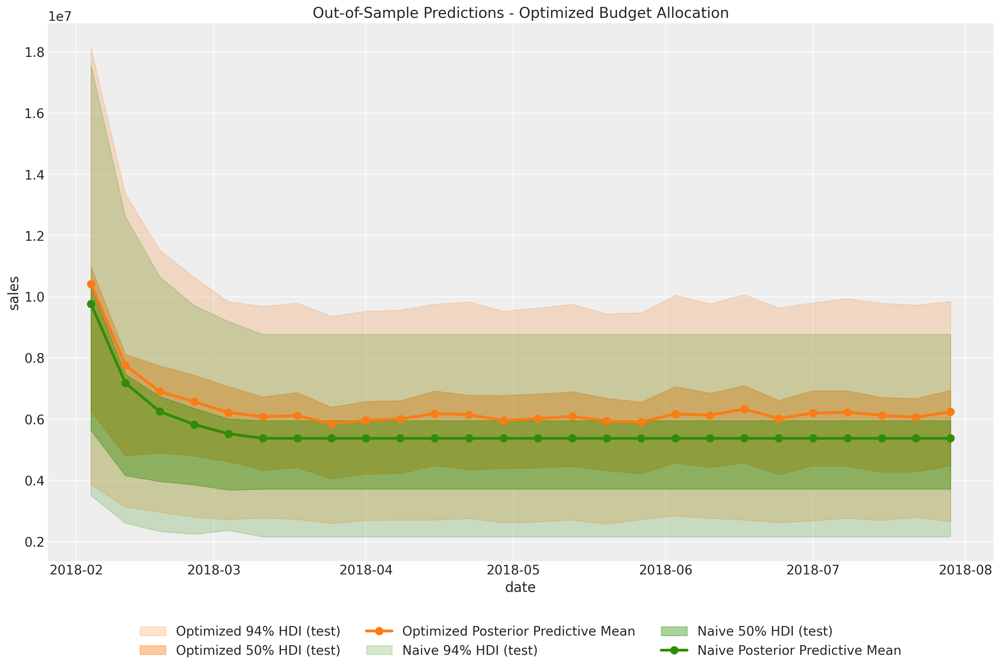

In [61]:
response_channel_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)


fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    response_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contribution"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

This figure compares out-of-sample posterior predictive sales under two spending plans: the optimized allocation (orange) and a naive/baseline allocation (green). The solid lines show the posterior predictive mean over time, while the shaded regions show uncertainty bands (HDIs), illustrating the range of plausible outcomes given model uncertainty. When the optimized curve sits above the naive curve—especially with limited overlap in uncertainty bands—it suggests that reallocating spend according to the MMM is expected to produce higher sales in the holdout period, not just in-sample.

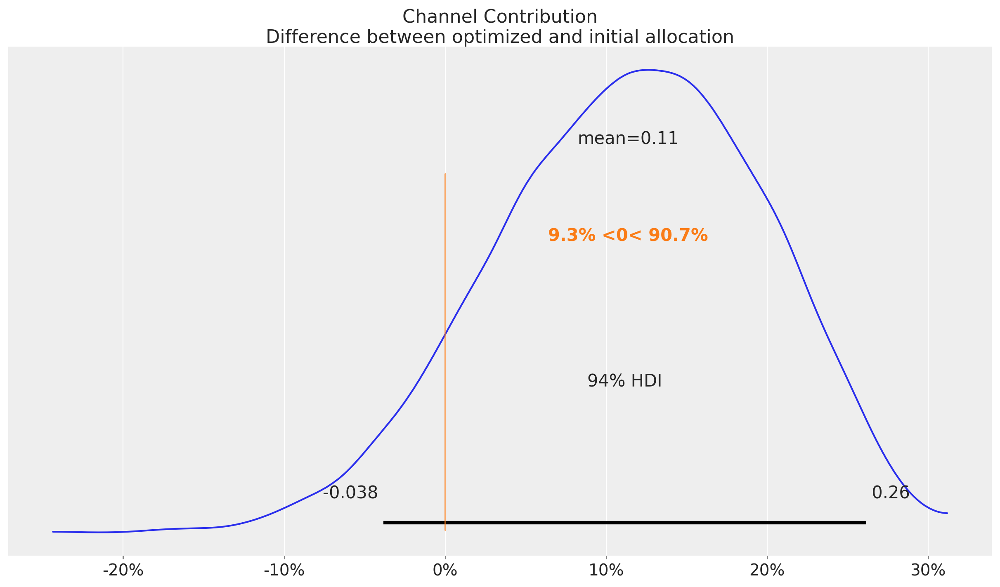

In [62]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_channel_contribution_original_scale.sum(dim="date")
        - pred_test_uniform["channel_contribution"]
        .unstack()
        .sum(dim="channel")
        .transpose(..., "date")
        .sum(dim="date")
    )
    / response_channel_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contribution\nDifference between optimized and initial allocation"
);

This plot summarizes the distribution of the aggregate uplift (difference) between the optimized plan and the initial/naive plan, computed from posterior predictive samples. Values to the right of zero indicate that the optimized allocation yields higher total channel contribution than the baseline; values to the left indicate the opposite. The labeled mean (e.g., ~0.11) provides the expected relative improvement, and the 94% HDI shows the uncertainty around that uplift. The probability mass to the right of zero (e.g., “90.7%”) quantifies how likely it is that the optimized allocation truly outperforms the baseline, making the result interpretable as a probabilistic performance gain rather than a single-point estimate.

# Sales Comparison
This section compares total out-of-sample sales under the optimized budget allocation versus a naive (baseline) allocation, using the same evaluation approach as before. The key difference is that the comparison is done at the total sales level, so components such as the baseline (intercept) and seasonality are included alongside media effects. For consistency, control variables are set to zero when future values are unavailable. This mirrors the logic used inside the allocate_budget_to_maximize_response() method.

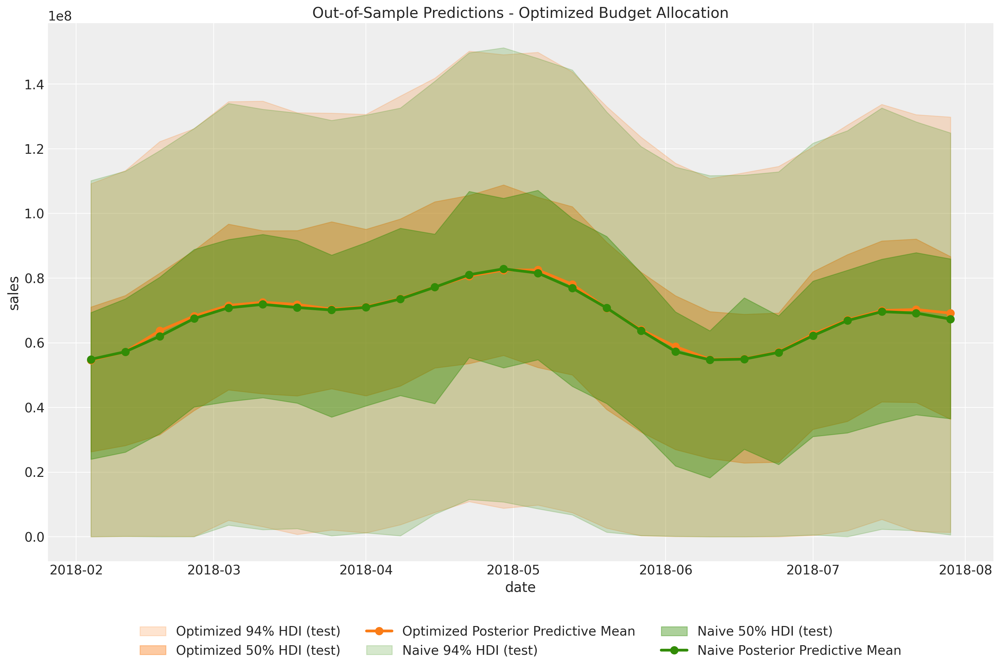

In [63]:
y_response_original_scale = apply_sklearn_transformer_across_dim(
    data=response["y"].unstack().transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    y_response_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date").mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

The figure overlays the posterior predictive mean and uncertainty bands (50% and 94% HDIs) for total sales in the holdout window under two scenarios: optimized allocation (orange) and naive allocation (green). The strong overlap between curves and intervals indicates that, when intercept and seasonality dominate total sales variability, the incremental difference attributable to reallocating media spend can appear modest at the total-sales level—even if channel contribution gains are clearer in the media-only comparison.

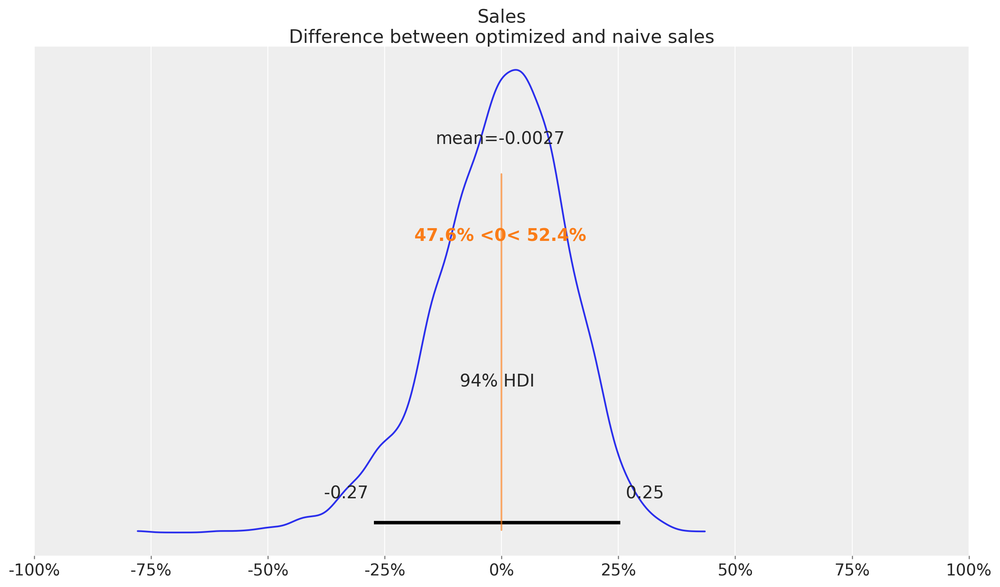

In [64]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        y_response_original_scale.sum(dim="date")
        - pred_test_uniform["y"].unstack().sum(dim="date")
    )
    / y_response_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(title="Sales\nDifference between optimized and naive sales", xlim=(-1, 1));

This plot shows the posterior distribution of the out-of-sample sales uplift, defined as the difference between total sales under the optimized allocation and the naive allocation. The vertical line at 0 represents “no change.” Because the distribution is centered very close to zero (mean ≈ −0.003) and the 94% HDI spans both negative and positive values, the result suggests no clear, statistically meaningful difference in total sales between the two strategies in the holdout period. The split percentages (about 47.6% below 0 vs 52.4% above 0) indicate the probability of improvement is roughly a coin flip.

This outcome is not necessarily contradictory to earlier gains in media-only channel contributions: total sales also include large components such as baseline (intercept) and seasonality, which can dominate the variance and make small incremental media improvements hard to detect. In addition, practical constraints (e.g., limiting budget shifts within bounds) can reduce the magnitude of achievable uplift, meaning the optimized plan may improve the efficiency of media contribution without producing a large, clearly separable change in total sales over this particular test window.



# Conclusion
This case study showcases an end-to-end workflow for using PyMC-Marketing to connect marketing spend to business outcomes and turn those insights into an actionable budget plan. After preparing the data and validating model fit with posterior predictive checks and diagnostics, the Bayesian MMM framework quantifies channel-level incremental contributions, carryover (adstock), and diminishing returns (saturation) while explicitly representing uncertainty. Those learned response curves enable scenario simulation and constrained optimization, producing a budget allocation that reflects both model-based efficiency and practical stakeholder requirements (e.g., upper/lower bounds per channel). Importantly, the out-of-sample results illustrate a realistic takeaway: optimization can deliver clearer improvements in media-driven contributions even when changes in total sales are less pronounced due to dominant baseline and seasonality effects and limited reallocation flexibility. Overall, the notebook provides a reproducible template for deploying MMM as a decision-support tool—supporting better spend governance, uncertainty-aware planning, and iterative refinement as new data becomes available.